# Differential abundance analysis of scRNA data
- load frequency table
- run CLR transfomration
- run linear mixed models

# Setup

In [5]:
quiet_library <- function(...) {
    suppressPackageStartupMessages(library(...))
}
quiet_library('Seurat')
quiet_library('tidyverse')
quiet_library('ggplot2')
quiet_library('dplyr')
quiet_library('viridis')
quiet_library('lmerTest')
quiet_library('broom.mixed')
quiet_library('data.table')

In [6]:
# define file path
# define working path
data_path = '/home/workspace/data/ra_longitudinal/output_results/Bmem'
fig_path = '/home/workspace/data/ra_longitudinal/figures/Bmem'
meta_path = '/home/workspace/github/ra-longitudinal/metadata'
output_path = '/home/workspace/data/ra_longitudinal/output_results/Bmem'

if(!dir.exists(fig_path)) (dir.create(fig_path, recursive = TRUE))
if(!dir.exists(output_path)) (dir.create(output_path, recursive = TRUE))


In [7]:
# define the color palette to be used
npg_color <- c("#E64B35FF", "#4DBBD5FF", "#00A087FF", "#3C5488FF", "#F39B7FFF", 
               "#8491B4FF", "#91D1C2FF", "#DC0000FF", "#7E6148FF", "#B09C85FF")
nejm_color <- c("#BC3C29FF", "#0072B5FF", "#E18727FF", "#20854EFF", "#7876B1FF", "#6F99ADFF", "#FFDC91FF", "#EE4C97FF")
jama_color <- c("#374E55FF", "#DF8F44FF", "#00A1D5FF", "#B24745FF", "#79AF97FF", "#6A6599FF", "#80796BFF")
jco_color <- c("#0073C2FF", "#EFC000FF", "#868686FF", "#CD534CFF", "#7AA6DCFF", "#003C67FF", "#8F7700FF")
cluster_colors <- c("#DC050C", "#FB8072", "#1965B0", "#7BAFDE", "#882E72", "#B17BA6", "#FF7F00", "#FDB462", "#E7298A", 
    "#E78AC3", "#33A02C", "#B2DF8A", "#55A1B1", "#8DD3C7", "#A6761D", "#E6AB02", "#7570B3", "#BEAED4", "#666666", "#999999", 
    "#aa8282", "#d4b7b7", "#8600bf", "#ba5ce3", "#808000", "#aeae5c", "#1e90ff", "#00bfff", "#56ff0d", "#ffff00")
cluster_colors_ext <- colorRampPalette(cluster_colors)(36)
options(repr.plot.width = 20, repr.plot.height = 15)

In [8]:
source('/home/workspace/github/ra-longitudinal/scRNA/ALTRA_scRNA_R_helper_functions.r')

In [9]:
# define a project name
proj_name <- 'ALTRA_Bmem_DA_'

# Run DA analysis for B mem and effector

In [ ]:
# load frequency
Bmem_freq = read_csv(file.path(data_path, 'ALTRA_scRNA_Bmem_certPro_B_mem_effector_leiden_0_8_freq.csv'),
                       col_select = -1, show_col_types = FALSE)%>%
    mutate(cell_type=factor(cell_type, levels = unique(as.numeric(cell_type))), 
          b_frequency=counts/total_b_counts)0
Bmem_freq %>% head()
Bmem_freq %>% distinct(sample.sampleKitGuid)%>%nrow()

In [ ]:
# add back the frequency for B naive to calcualte CLR
# extract other cell frequency for clr transformation
other_counts <- Bmem_freq %>% group_by(sample.sampleKitGuid) %>% 
    mutate(sum_counts=sum(counts)) %>% 
    mutate(counts=total_b_counts-sum_counts, b_frequency=counts/total_b_counts,
          cell_type='Naive_transitional') %>%
    dplyr::select(-c(sum_counts, bmem_frequency))%>%ungroup()%>%
    arrange(sample.sampleKitGuid)%>%distinct(sample.sampleKitGuid, .keep_all = TRUE)
other_counts%>%head()
Bmem_freq_clr <- Bmem_freq %>% bind_rows(other_counts)

In [ ]:
# Bmem_freq_clr%>%group_by(sample.sampleKitGuid)%>%summarise(freq = sum(b_frequency))

In [ ]:
# add pseudocount 1 to the data
Bmem_freq_clr <- Bmem_freq_clr %>% mutate(pseudo_count = counts + 1, 
                                 pseudo_b_counts=total_b_counts+nrow(distinct(Bmem_freq_clr, cell_type)), 
                                 pseudo_b_frequency = pseudo_count/pseudo_b_counts, 
                                 bmem_freq = counts/bmem_counts)

In [ ]:
Bmem_freq_clr %>% group_by(sample.sampleKitGuid)%>%summarise(freq = sum(pseudo_b_frequency))

In [ ]:
# perform clr transformation
# clr calculated based on the frequency out of B cells
Bmem_freq_clr <- FreqClrTran(Bmem_freq_clr, freq_col='pseudo_b_frequency',
                                   celltype_col='cell_type', clr_name='clr',
                          sample_col='sample.sampleKitGuid')

In [ ]:
# # perform clr transformation
# Bmem_freq_clr <- FreqClrTran(Bmem_freq, freq_col='bmem_frequency',
#                                    celltype_col='cell_type', clr_name='clr',
#                           sample_col='sample.sampleKitGuid')

In [ ]:
Bmem_freq_clr%>%head()

In [14]:
# filter cell type that are too rare to do analysis
rare_celltype <- Bmem_freq %>% dplyr::filter(counts==0)%>%
    group_by(cell_type)%>%tally()%>% arrange(desc(n))%>%
    filter(n>50)%>%
    pull(cell_type)
rare_celltype

[1] 6  11
Levels: 0 1 2 3 4 5 6 7 8 9 10 11

In [15]:
Bmem_freq_clr%>%colnames()

[1] "sample.sampleKitGuid"    "cell_type"              
 [3] "bmem_frequency"          "subject.subjectGuid"    
 [5] "subject.biologicalSex"   "days_to_conversion"     
 [7] "status"                  "file.batchID"           
 [9] "Status_Long"             "age_conv"               
[11] "bmi_conv"                "BMI"                    
[13] "anti_ccp3_finalCombined" "Status_Xsec"            
[15] "total_b_counts"          "counts"                 
[17] "bmem_counts"             "b_frequency"            
[19] "pseudo_count"            "pseudo_b_counts"        
[21] "pseudo_b_frequency"      "bmem_freq"              
[23] "clr"

In [142]:
# save the frequency results
Bmem_freq_clr %>% write_csv(file.path(output_path, paste0(proj_name, 'frequency_clr_table.csv')))

In [10]:
# save the frequency results
Bmem_freq_clr <- read_csv(file.path(output_path, paste0(proj_name, 'frequency_clr_table.csv')))

Rows: 1833 Columns: 23
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (8): sample.sampleKitGuid, cell_type, subject.subjectGuid, subject.biol...
dbl (15): bmem_frequency, days_to_conversion, age_conv, bmi_conv, BMI, anti_...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


# AIM1 cross-sectional analysis

In [17]:
# load the AIM1 metadata
aim1_filedesc_fl <- read_csv(file.path(meta_path, 'ALTRA_RA_Aim1_ALTRA_at_risk_vs_HCs_scrna_metadata.csv'), 
                             show_col_types = FALSE)
# make aim1 frequency table
Bmem_freq_aim1 <- Bmem_freq_clr %>%filter(sample.sampleKitGuid%in%aim1_filedesc_fl$sample.sampleKitGuid)%>%
    mutate(status=if_else(Status_Long=='pre', 'at_risk_conveters', status), 
          status=coalesce(status, Status_Xsec))

In [18]:
Bmem_freq_aim1$Status_Xsec%>%unique()
Bmem_freq_aim1%>%colnames()

[1] "at_risk"       "ALTRA_healthy"

[1] "sample.sampleKitGuid"    "cell_type"              
 [3] "bmem_frequency"          "subject.subjectGuid"    
 [5] "subject.biologicalSex"   "days_to_conversion"     
 [7] "status"                  "file.batchID"           
 [9] "Status_Long"             "age_conv"               
[11] "bmi_conv"                "BMI"                    
[13] "anti_ccp3_finalCombined" "Status_Xsec"            
[15] "total_b_counts"          "counts"                 
[17] "bmem_counts"             "b_frequency"            
[19] "pseudo_count"            "pseudo_b_counts"        
[21] "pseudo_b_frequency"      "bmem_freq"              
[23] "clr"

In [176]:
Bmem_freq_aim1%>%head()

sample.sampleKitGuid,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,days_to_conversion,status,file.batchID,Status_Long,age_conv,⋯,Status_Xsec,total_b_counts,counts,bmem_counts,b_frequency,pseudo_count,pseudo_b_counts,pseudo_b_frequency,bmem_freq,clr
<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,⋯,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
KT00052,0,0.1476190,CU1009,Female,-714,at_risk_conveters,B140,pre,58,⋯,at_risk,1432,62,420,0.04329609,63,1446,0.04356846,0.1476190,1.0395314
KT00056,0,0.1019108,CU1007,Female,-632,at_risk_conveters,B002,pre,44,⋯,at_risk,1136,48,471,0.04225352,49,1150,0.04260870,0.1019108,0.5416030
KT00057,0,0.2195122,CU1003,Female,-615,at_risk_conveters,B002,pre,23,⋯,at_risk,970,99,451,0.10206186,100,984,0.10162602,0.2195122,1.4071773
KT00058,0,0.1209830,CU1002,Female,NA,at_risk,B001,NA,NA,⋯,at_risk,912,64,529,0.07017544,65,926,0.07019438,0.1209830,0.8016646
KT00060,0,0.3069498,CU1005,Female,NA,at_risk,B002,NA,NA,⋯,at_risk,991,159,518,0.16044400,160,1005,0.15920398,0.3069498,1.9942441
KT00063,0,0.1550079,CU1011,Male,NA,at_risk,B140,NA,NA,⋯,at_risk,1744,195,1258,0.11181193,196,1758,0.11149033,0.1550079,1.4451625


In [177]:
Bmem_freq_aim1%>%group_by(status, Status_Xsec, Status_Long)%>%tally()

status,Status_Xsec,Status_Long,n
<chr>,<chr>,<chr>,<int>
ALTRA_healthy,ALTRA_healthy,NA,434
at_risk,at_risk,NA,434
at_risk_conveters,at_risk,pre,196


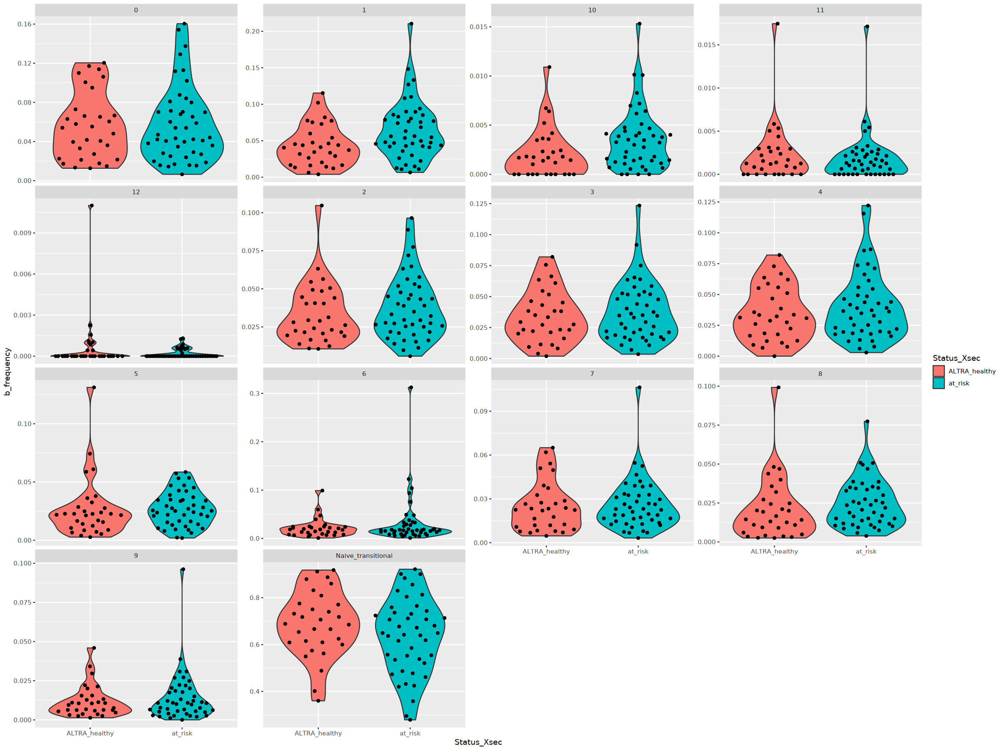

In [178]:
# plot frequency by cell types
Bmem_freq_aim1 %>% 
    ggplot(aes(x=Status_Xsec, y=b_frequency))+
   geom_violin(aes(fill=Status_Xsec)) + 
   ggbeeswarm::geom_quasirandom() +
   facet_wrap(vars(cell_type), scales = 'free_y') 
ggsave(file.path(fig_path, paste0(proj_name, 
                                  '_AIM1_b_frequency.png')), width=12, height=8)

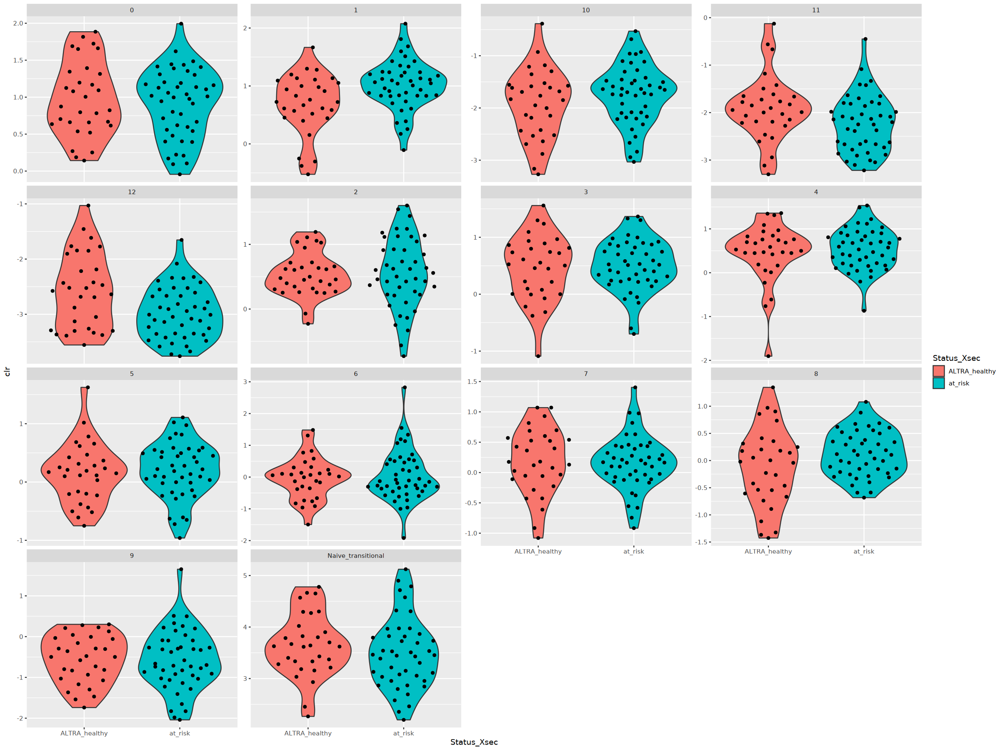

In [180]:
# plot frequency by cell types
Bmem_freq_aim1 %>% 
    ggplot(aes(x=Status_Xsec, y=clr))+
   geom_violin(aes(fill=Status_Xsec)) + 
   ggbeeswarm::geom_quasirandom() +
   facet_wrap(vars(cell_type), scales = 'free_y') 
ggsave(file.path(fig_path, paste0(proj_name, 
                                  '_AIM1_b_pseudo_clr.png')), width=12, height=8)

In [181]:
Bmem_freq_aim1%>%distinct(Status_Xsec)

Status_Xsec
<chr>
at_risk
ALTRA_healthy


In [183]:
 # run wilcox test for frequency pretreatment vs healthy 
freq_stats_wilcox_pre <- Bmem_freq_aim1 %>% group_by(cell_type)%>%
    mutate(Status_Xsec=factor(Status_Xsec, levels = c('ALTRA_healthy', 'at_risk'))) %>%
    rstatix::wilcox_test(data =., clr ~ Status_Xsec, paired = FALSE)%>%
    rstatix::adjust_pvalue(method = "BH") %>%
    rstatix::add_significance("p.adj") 
freq_stats_wilcox_pre%>%arrange(p)%>%head(10)

cell_type,.y.,group1,group2,n1,n2,statistic,p,p.adj,p.adj.signif
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>
1,clr,ALTRA_healthy,at_risk,31,45,443,0.00674,0.0924000,ns
12,clr,ALTRA_healthy,at_risk,31,45,931,0.01320,0.0924000,ns
11,clr,ALTRA_healthy,at_risk,31,45,898,0.03400,0.1586667,ns
8,clr,ALTRA_healthy,at_risk,31,45,553,0.12900,0.4515000,ns
10,clr,ALTRA_healthy,at_risk,31,45,581,0.22200,0.5856667,ns
Naive_transitional,clr,ALTRA_healthy,at_risk,31,45,807,0.25100,0.5856667,ns
5,clr,ALTRA_healthy,at_risk,31,45,649,0.61400,0.8785000,ns
7,clr,ALTRA_healthy,at_risk,31,45,741,0.65100,0.8785000,ns
0,clr,ALTRA_healthy,at_risk,31,45,733,0.71300,0.8785000,ns


In [ ]:
Bmem_freq_aim1 %>% filter(cell_type=='1')%>%
    ggplot(aes(x=status, y=pseudo_clr))+
   geom_violin(aes(fill=status)) + 
   ggbeeswarm::geom_quasirandom() 
ggsave(file.path(fig_path, paste0(proj_name, 
                                  '_AIM2_b_C1_clr.png')), width=5, height=5)

# AIM2 cross-sectional analysis

In [39]:
# load the AIM1 metadata
aim2_filedesc_fl <- read_csv(file.path(meta_path, 'ALTRA_RA_Aim2_ALTRA_early_RA_vs_HCs_scrna_metadata.csv'), 
                             show_col_types = FALSE)
# make aim1 frequency table
Bmem_freq_aim2 <- Bmem_freq_clr %>%filter(sample.sampleKitGuid%in%aim2_filedesc_fl$sample.sampleKitGuid)

In [40]:
Bmem_freq_aim2$Status_Xsec%>%unique()
Bmem_freq_aim2$status%>%unique()
Bmem_freq_aim2%>%colnames()

[1] "early_RA"      "ALTRA_healthy"

[1] "early_RA"      "conversion"    "ALTRA_healthy"

[1] "sample.sampleKitGuid"    "cell_type"              
 [3] "bmem_frequency"          "subject.subjectGuid"    
 [5] "subject.biologicalSex"   "days_to_conversion"     
 [7] "status"                  "file.batchID"           
 [9] "Status_Long"             "age_conv"               
[11] "bmi_conv"                "BMI"                    
[13] "anti_ccp3_finalCombined" "Status_Xsec"            
[15] "total_b_counts"          "counts"                 
[17] "bmem_counts"             "b_frequency"            
[19] "pseudo_count"            "pseudo_b_counts"        
[21] "pseudo_b_frequency"      "pseudo_clr"

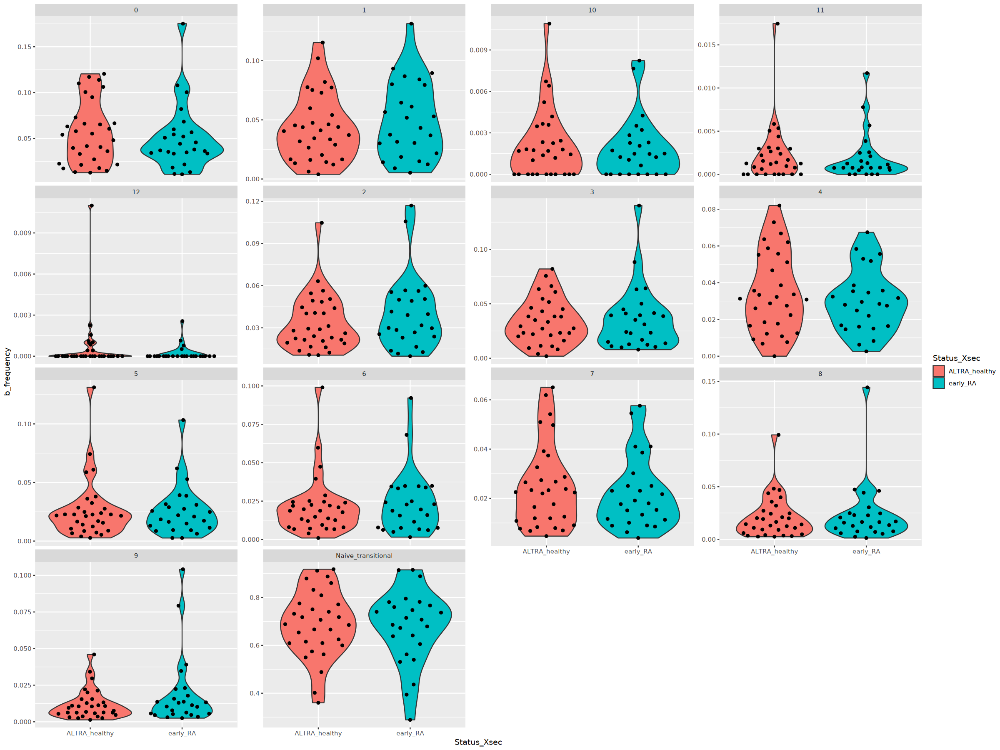

In [41]:
# plot frequency by cell types
Bmem_freq_aim2 %>% 
    ggplot(aes(x=Status_Xsec, y=b_frequency))+
   geom_violin(aes(fill=Status_Xsec)) + 
   ggbeeswarm::geom_quasirandom() +
   facet_wrap(vars(cell_type), scales = 'free_y') 
ggsave(file.path(fig_path, paste0(proj_name, 
                                  '_AIM2_b_frequency.png')), width=12, height=8)

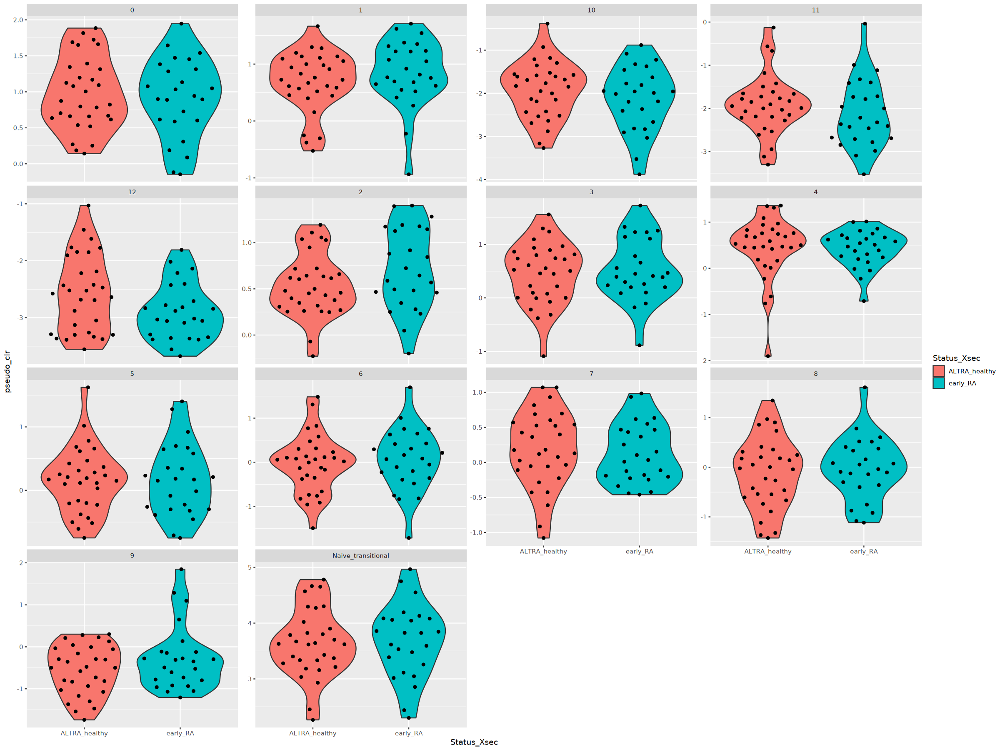

In [42]:
# plot frequency by cell types
Bmem_freq_aim2 %>% 
    ggplot(aes(x=Status_Xsec, y=pseudo_clr))+
   geom_violin(aes(fill=Status_Xsec)) + 
   ggbeeswarm::geom_quasirandom() +
   facet_wrap(vars(cell_type), scales = 'free_y') 
ggsave(file.path(fig_path, paste0(proj_name, 
                                  '_AIM2_b_pseudo_clr.png')), width=12, height=8)

In [46]:
 # run wilcox test for frequency pretreatment vs healthy 
freq_stats_wilcox_pre <- Bmem_freq_aim2 %>% filter(cell_type=='9') %>%
    mutate(Status_Xsec=factor(Status_Xsec, levels = c('ALTRA_healthy', 'early_RA'))) %>%
    rstatix::wilcox_test(data =., b_frequency ~ Status_Xsec, paired = FALSE)
freq_stats_wilcox_pre

,.y.,group1,group2,n1,n2,statistic,p
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>
1,b_frequency,ALTRA_healthy,early_RA,31,25,332,0.368


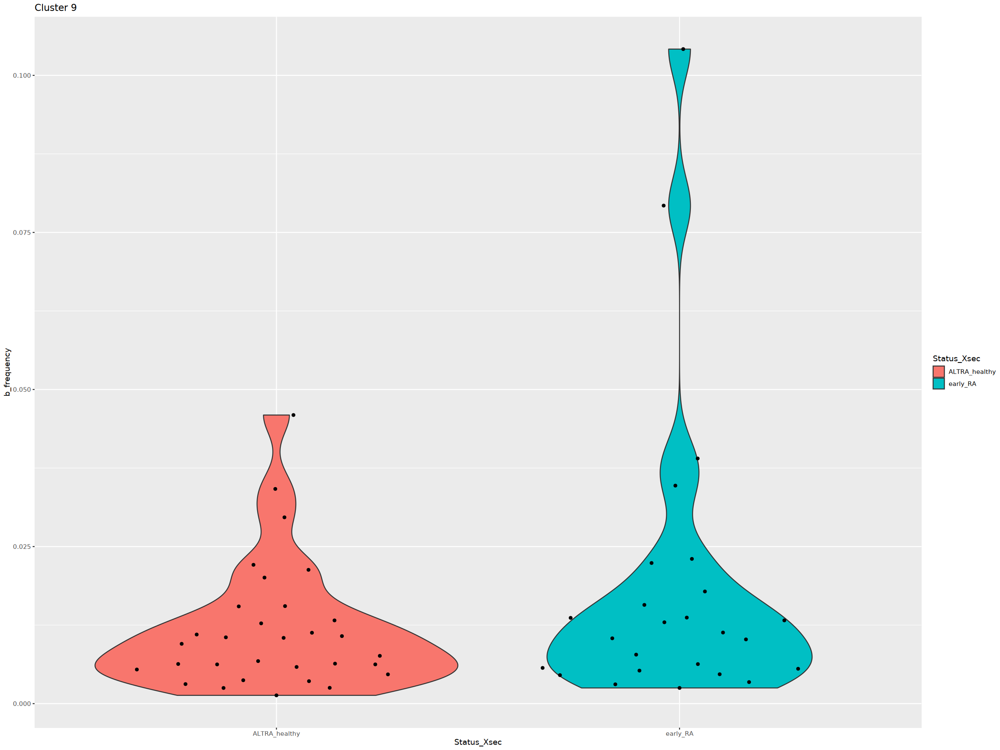

In [47]:
Bmem_freq_aim2 %>% filter(cell_type=='9')%>%
    ggplot(aes(x=Status_Xsec, y=b_frequency))+
   geom_violin(aes(fill=Status_Xsec)) + 
   ggbeeswarm::geom_quasirandom() + ggtitle('Cluster 9')
ggsave(file.path(fig_path, paste0(proj_name, 
                                  '_AIM2_b_C9_frequency.png')), width=5, height=5)

# AIM3 analysis

In [11]:
# isolate the aim3 freq
aim3_meta <- read_csv(file.path(meta_path, 'ALTRA_RA_Aim3_ALTRA_converters_longitudinal_scrna_metadata.csv'))
Bmem_freq_aim3 = Bmem_freq_clr %>%
    filter(sample.sampleKitGuid%in%aim3_meta$sample.sampleKitGuid & days_to_conversion > (-750))
Bmem_freq_aim3%>%colnames()

Rows: 68 Columns: 33
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (18): sample.id, sample.sampleKitGuid, sample.visitName, sample.visitDe...
dbl   (5): sample.daysSinceFirstVisit, file.majorVersion, subject.birthYear,...
lgl   (8): sample.bridgingControl, file.panel, file.userTags.details, file.u...
dttm  (2): lastUpdated, sample.drawDate

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] "sample.sampleKitGuid"    "cell_type"              
 [3] "bmem_frequency"          "subject.subjectGuid"    
 [5] "subject.biologicalSex"   "days_to_conversion"     
 [7] "status"                  "file.batchID"           
 [9] "Status_Long"             "age_conv"               
[11] "bmi_conv"                "BMI"                    
[13] "anti_ccp3_finalCombined" "Status_Xsec"            
[15] "total_b_counts"          "counts"                 
[17] "bmem_counts"             "b_frequency"            
[19] "pseudo_count"            "pseudo_b_counts"        
[21] "pseudo_b_frequency"      "bmem_freq"              
[23] "clr"

In [20]:
Bmem_freq_aim3%>%distinct(sample.sampleKitGuid)%>%nrow()
aim3_meta%>%nrow()

[1] 59

[1] 68

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


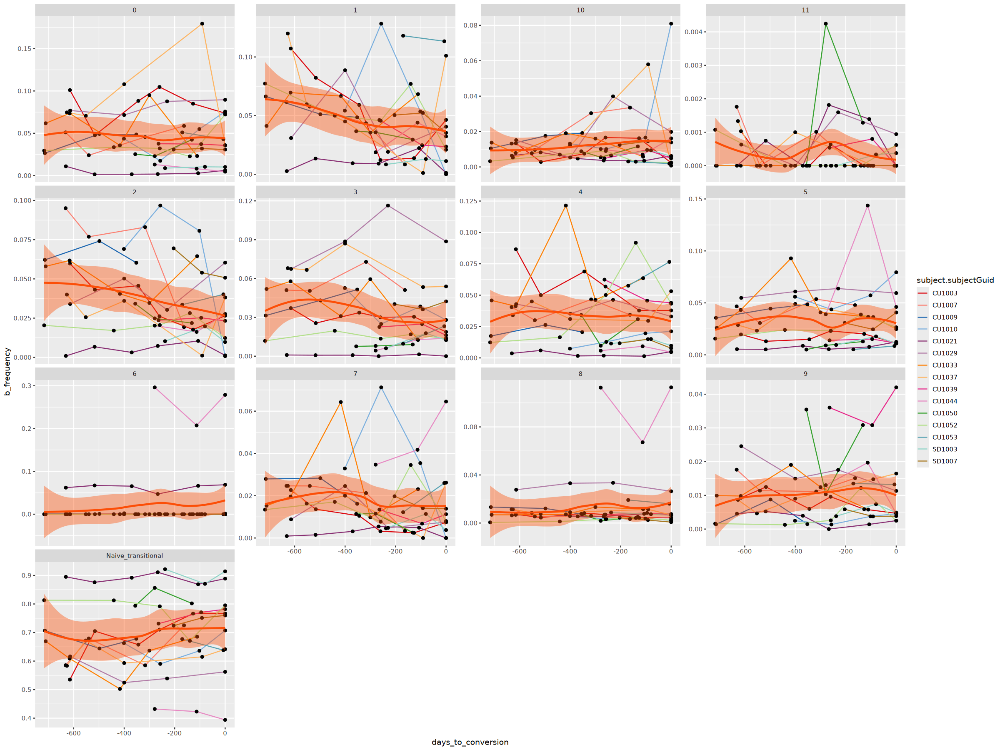

In [26]:
options(repr.plot.width = 20, repr.plot.height = 15)
# plot frequency
p1<- Bmem_freq_aim3 %>%  ggplot(aes(x=days_to_conversion, y=b_frequency)) +
    geom_line(aes(color=subject.subjectGuid)) + geom_point()+ 
    stat_smooth(
  color = "#FC4E07", fill = "#FC4E07",
  method = "loess"
  ) + facet_wrap(vars(cell_type), scales = 'free_y') + scale_color_manual(values = cluster_colors)
p1
ggsave(file.path(fig_path, paste0(proj_name, 
                                  '_Bcell_frequency.png')), width =18, height=12)


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


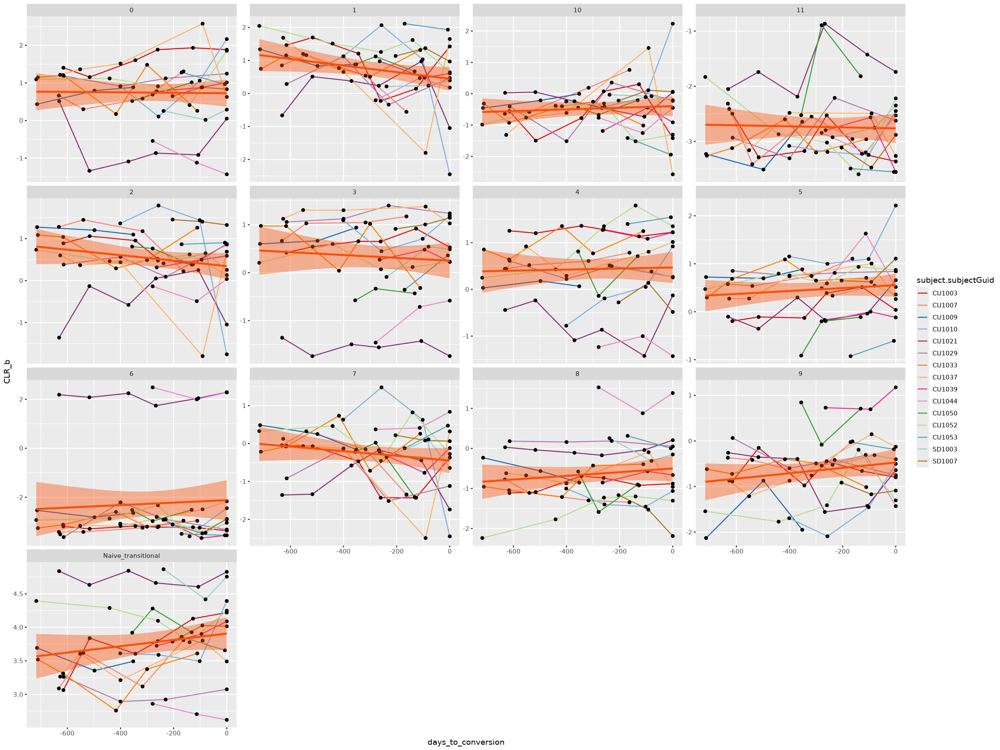

In [27]:
options(repr.plot.width = 20, repr.plot.height = 15)
p2 <- Bmem_freq_aim3 %>% ggplot(aes(x=days_to_conversion, y=`clr`)) +
    geom_line(aes(color=subject.subjectGuid)) + geom_point()+ 
    stat_smooth(
  color = "#FC4E07", fill = "#FC4E07",
  method = "lm"
  ) + facet_wrap(vars(cell_type), scales = 'free_y') +
    scale_color_manual(values = cluster_colors) + ylab('CLR_b')
p2
ggsave(file.path(fig_path, paste0(proj_name, '_Bcell_clr.png')), 
       width =18, height=12)

## linear mixed model

In [12]:
Bmem_freq_aim3%>%distinct(cell_type)

cell_type
<chr>
0
1
2
3
4
5
6
7
8


In [15]:
# take one cell type to model first
effector_freq <- Bmem_freq_aim3%>%filter(cell_type%in%c('8','9'))

In [ ]:
# save results
effector_freq%>%writexl::write_xlsx(file.path(output_path, 'Table_S21_Beffector_cluster_frequency.xlsx'))

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


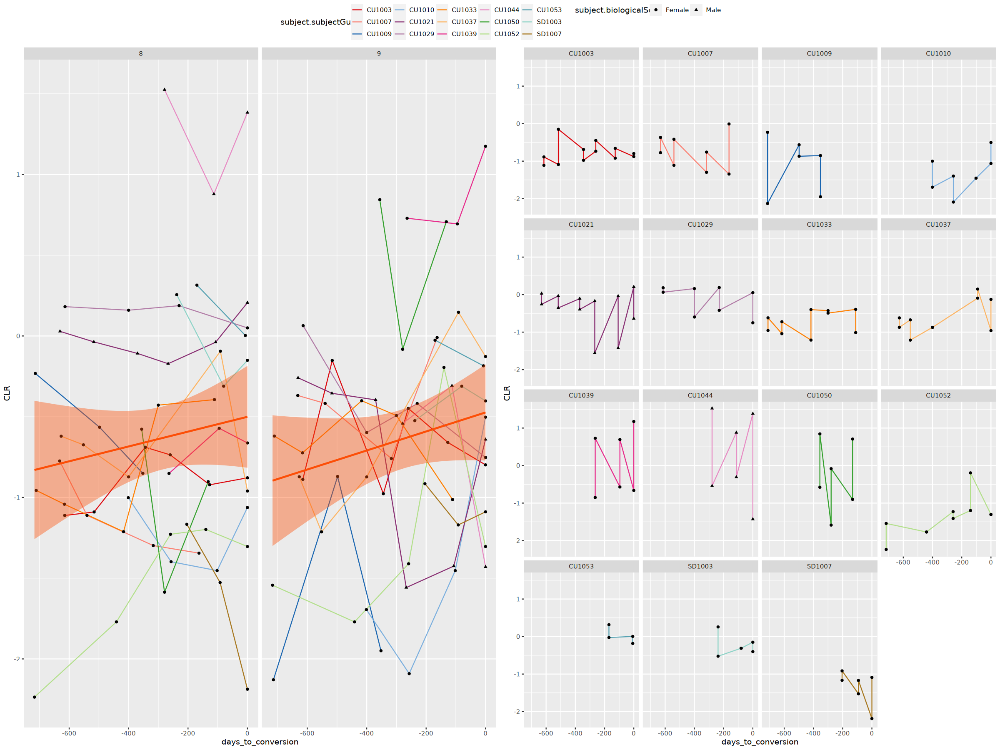

In [16]:

p2 <- effector_freq %>% ggplot(aes(x=days_to_conversion, y=`clr`)) +
    geom_line(aes(color=subject.subjectGuid)) + geom_point(aes(shape=subject.biologicalSex))+ 
    stat_smooth(
  color = "#FC4E07", fill = "#FC4E07",
  method = "lm"
  ) + facet_wrap(vars(cell_type)) + scale_color_manual(values = cluster_colors)+ ylab('CLR')

p3 <- effector_freq %>%  ggplot(aes(x=days_to_conversion, y=`clr`)) +
    geom_line(aes(color=subject.subjectGuid)) + geom_point(aes(shape=subject.biologicalSex)) + 
    facet_wrap(vars(subject.subjectGuid)) + 
    scale_color_manual(values = cluster_colors)+ ylab('CLR')
ggpubr::ggarrange(p2, p3, common.legend = TRUE)
ggsave(file.path(fig_path, paste0(proj_name, '_AIM3_cluster9_b_clr.png')), 
       width =12, height=6)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


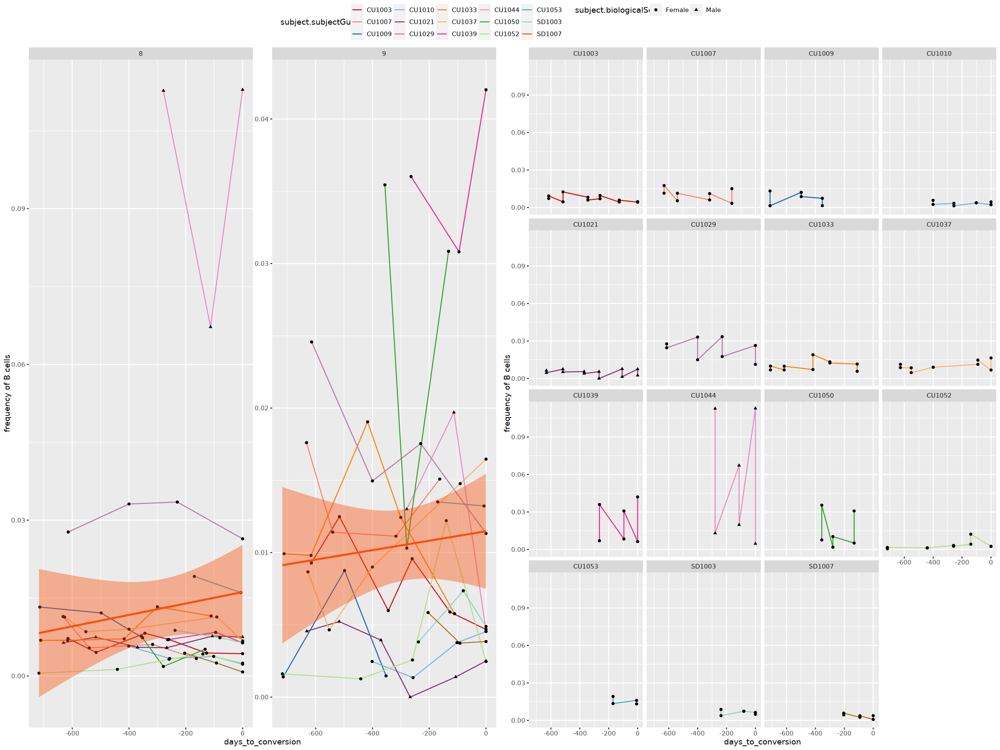

In [17]:
p2 <- effector_freq %>% ggplot(aes(x=days_to_conversion, y=`b_frequency`)) +
    geom_line(aes(color=subject.subjectGuid)) + geom_point(aes(shape=subject.biologicalSex))+ 
    stat_smooth(
  color = "#FC4E07", fill = "#FC4E07",
  method = "lm"
  ) + facet_wrap(vars(cell_type), scales = 'free_y') + scale_color_manual(values = cluster_colors)+ ylab('frequency of B cells')

p3 <- effector_freq %>%  ggplot(aes(x=days_to_conversion, y=`b_frequency`)) +
    geom_line(aes(color=subject.subjectGuid)) + geom_point(aes(shape=subject.biologicalSex)) + 
    facet_wrap(vars(subject.subjectGuid)) + 
    scale_color_manual(values = cluster_colors)+ ylab('frequency of B cells')
ggpubr::ggarrange(p2, p3, common.legend = TRUE)
ggsave(file.path(fig_path, paste0(proj_name, 'AIM3_cluster9_b_frequency.png')), 
       width =12, height=6)

In [18]:
effector_freq%>%colnames()

[1] "sample.sampleKitGuid"    "cell_type"              
 [3] "bmem_frequency"          "subject.subjectGuid"    
 [5] "subject.biologicalSex"   "days_to_conversion"     
 [7] "status"                  "file.batchID"           
 [9] "Status_Long"             "age_conv"               
[11] "bmi_conv"                "BMI"                    
[13] "anti_ccp3_finalCombined" "Status_Xsec"            
[15] "total_b_counts"          "counts"                 
[17] "bmem_counts"             "b_frequency"            
[19] "pseudo_count"            "pseudo_b_counts"        
[21] "pseudo_b_frequency"      "bmem_freq"              
[23] "clr"

In [19]:
# # take one cell type to model first

# p3<- ggpubr::ggscatter(effector_freq, x='b_frequency', 
#               y='anti_ccp3_finalCombined', color='subject.subjectGuid',
#    cor.coef = TRUE, # Add correlation coefficient. see ?stat_cor
#    cor.coeff.args = list(method = "spearman", label.x = 0.01, label.sep = "\n")) 
# p3

In [20]:
effector_freq%>%colnames()
effector_freq%>%dim()

[1] "sample.sampleKitGuid"    "cell_type"              
 [3] "bmem_frequency"          "subject.subjectGuid"    
 [5] "subject.biologicalSex"   "days_to_conversion"     
 [7] "status"                  "file.batchID"           
 [9] "Status_Long"             "age_conv"               
[11] "bmi_conv"                "BMI"                    
[13] "anti_ccp3_finalCombined" "Status_Xsec"            
[15] "total_b_counts"          "counts"                 
[17] "bmem_counts"             "b_frequency"            
[19] "pseudo_count"            "pseudo_b_counts"        
[21] "pseudo_b_frequency"      "bmem_freq"              
[23] "clr"

[1] 118  23

In [21]:
# test the model in c9
formula_linear1 <- as.formula("clr ~ age_conv + bmi_conv + days_to_conversion + (1 |subject.subjectGuid)")

c9_fit <- lmer(formula = formula_linear1,
                         data = effector_freq%>%filter(
          subject.biologicalSex=='Female'))
summary(c9_fit)

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: formula_linear1
   Data: effector_freq %>% filter(subject.biologicalSex == "Female")

REML criterion at convergence: 201.1

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-2.42003 -0.52670  0.08055  0.61568  2.39937 

Random effects:
 Groups              Name        Variance Std.Dev.
 subject.subjectGuid (Intercept) 0.2275   0.4770  
 Residual                        0.2615   0.5114  
Number of obs: 100, groups:  subject.subjectGuid, 13

Fixed effects:
                     Estimate Std. Error         df t value Pr(>|t|)
(Intercept)        -1.3084902  0.8174161  9.5546201  -1.601    0.142
age_conv            0.0129871  0.0111740  9.4981866   1.162    0.274
bmi_conv            0.0051863  0.0265399  9.4681583   0.195    0.849
days_to_conversion  0.0004400  0.0002655 94.0004529   1.657    0.101

Correlation of Fixed Effects:
            (Intr) ag_cnv bm_cnv
age_conv    -0.429    

In [22]:
# test the model in c9
formula_linear1 <- as.formula("clr ~ age_conv + bmi_conv + days_to_conversion + (1 |subject.subjectGuid)")

c8_fit <- lmer(formula = formula_linear1,
                         data = Bmem_freq_aim3%>%filter(cell_type=='8')%>%filter(
          subject.biologicalSex=='Female'))
summary(c8_fit)

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: formula_linear1
   Data: 
Bmem_freq_aim3 %>% filter(cell_type == "8") %>% filter(subject.biologicalSex ==  
    "Female")

REML criterion at convergence: 85.8

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-2.00501 -0.57260  0.01864  0.62199  1.58245 

Random effects:
 Groups              Name        Variance Std.Dev.
 subject.subjectGuid (Intercept) 0.2954   0.5435  
 Residual                        0.1052   0.3244  
Number of obs: 50, groups:  subject.subjectGuid, 13

Fixed effects:
                     Estimate Std. Error         df t value Pr(>|t|)
(Intercept)        -1.3554163  0.9080131  9.6907114  -1.493    0.167
age_conv            0.0179319  0.0124193  9.6484115   1.444    0.180
bmi_conv           -0.0071486  0.0295047  9.6336089  -0.242    0.814
days_to_conversion  0.0002234  0.0002407 38.7833780   0.928    0.359

Correlation of Fixed Effects:
            (Intr) a

In [23]:
# combine the stats for c8 and c9
c8_c9_res = tidy(c8_fit)%>%mutate(cluster = '8') %>% bind_rows(mutate(tidy(c9_fit), cluster = '9'))

In [24]:
c8_c9_res%>%filter(term=='days_to_conversion')%>%rstatix::adjust_pvalue(p.col = 'p.value', method = 'BH')

effect,group,term,estimate,std.error,statistic,df,p.value,cluster,p.value.adj
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
fixed,NA,days_to_conversion,0.0002233528,0.0002406587,0.9280894,38.78338,0.3591015,8,0.3591015
fixed,NA,days_to_conversion,0.0004399675,0.0002654730,1.6572961,94.00045,0.1007936,9,0.2015873


In [36]:
# # test the model in
# formula_linear1 <- as.formula("clr ~ age_conv + bmi_conv + subject.biologicalSex + days_to_conversion + (1 |subject.subjectGuid)")

# c9_fit <- lmer(formula = formula_linear1,
#                          data = effector_freq)
# summary(c9_fit)

In [91]:
# formula_linear2 <- as.formula("clr ~ age_conv + bmi_conv + subject.biologicalSex + days_to_conversion + (1 |subject.subjectGuid)")
# c8_fit2 <- lmer(formula = formula_linear2,
#                          data = Bmem_freq_aim3%>%filter(cell_type=='9'))
# summary(c8_fit2)

In [92]:
# formula_linear2 <- as.formula(" pseudo_clr ~ age_conv + bmi_conv  + days_to_conversion + (1 |subject.subjectGuid)")

# # cd16mono_fit1 <- lmer(formula = formula_linear1, 
# #                          data    = cd16mono_freq)
# # formula_quad <- as.formula(" pseudo_clr ~ age + subject.biologicalSex + poly(days_to_conversion, 2) + (1 + days_to_conversion|subject.subjectGuid)")
# c3_fit <- lmer(formula = formula_linear2,
#                          data = Bmem_freq_aim3%>%filter(cell_type=='10'&
#           subject.biologicalSex=='Female'))
# summary(c3_fit)

In [25]:
#' Plot linear mixed model fit for individual gene
#'
#' This function plots the linear mixed model fit for an individual gene.
#'
#' @param fit The fitted linear mixed model object.
#' @param gene The name of the gene to plot.
#'
#' @return A plot showing the residual plot and the predicted regression line.
#'
#' @import ggplot2
#' @import cowplot
#' @import modelr
#' @import broom.mixed
#' @importFrom stats resid
#' @importFrom stats smooth
#' @importFrom stats add_predictions
#' @importFrom stats data_grid
#' @importFrom stats augment
#' @importFrom stats lm
#' @importFrom stats hline
#' @importFrom stats point
#' @importFrom stats line
#' @importFrom stats color_manual
#' @importFrom stats ggtitle
#' @importFrom stats scale_color_manual
#' @importFrom stats theme_bw
#' @importFrom stats ylab
plotFitLmer <- function(fit) {
    # extract the fit data
    fit_data <- fit@frame
    predicted_values <- modelr::data_grid(
        fit_data, age_conv, bmi_conv,
        days_to_conversion, subject.subjectGuid
    ) %>%
        modelr::add_predictions(fit)
    
    # plot the residue
    df_model <- broom.mixed::augment(fit)
    df_model[".stdresid"] <- resid(fit, type = "pearson")
    
    p1 <- ggplot(df_model, aes(.fitted, .resid)) +
        geom_point() +
        geom_hline(yintercept = 0) +
        geom_smooth(se = FALSE) +
        theme_bw()
    
    # plot the predicted regression line
    p2 <- fit_data %>% ggplot(aes(x = days_to_conversion, y = clr)) +
        geom_line(aes(color = subject.subjectGuid)) +
        geom_point(aes(color = subject.subjectGuid)) +
        stat_smooth(
            data = predicted_values, method = "lm", se = FALSE,
            aes(x = days_to_conversion, y = pred, color = subject.subjectGuid)
        ) +
       # ggtitle(gene) +
        scale_color_manual(values = cluster_colors) +
        theme_bw() +
        ylab("Normalized count")
    
    return(cowplot::plot_grid(p1, p2))
}


`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


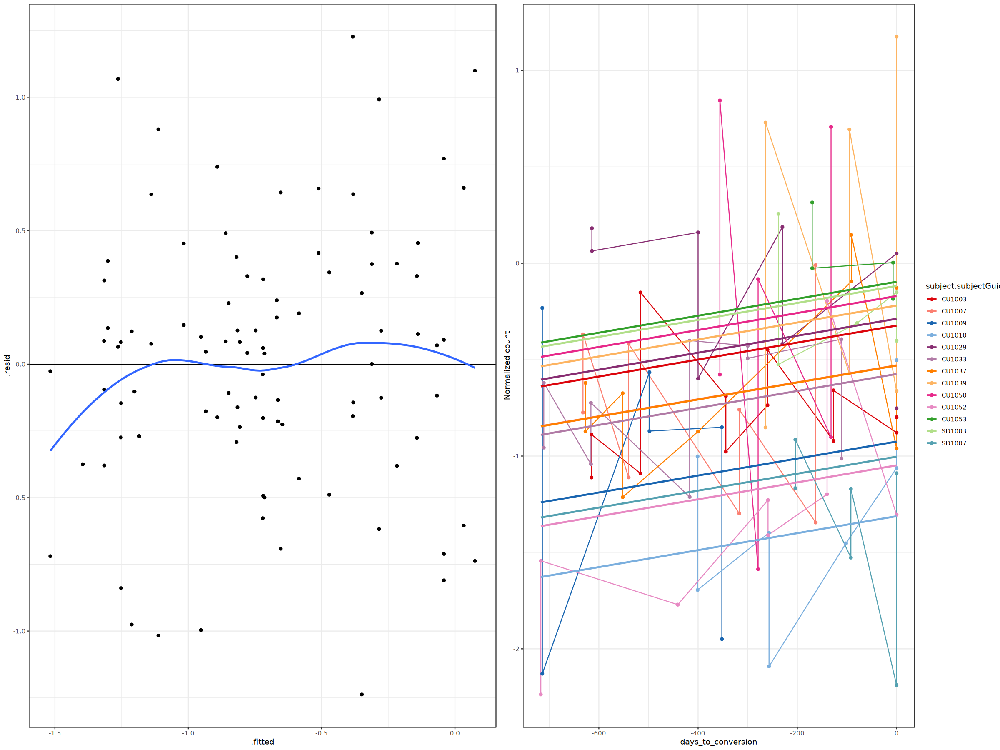

In [26]:
plotFitLmer(c9_fit)
ggsave(file.path(fig_path, paste0(proj_name, 'cluster9_clr_model_fit.png')), 
       width =12, height=6)

### plot figures

In [27]:
Bmem_freq_aim3%>%head()

sample.sampleKitGuid,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,days_to_conversion,status,file.batchID,Status_Long,age_conv,⋯,Status_Xsec,total_b_counts,counts,bmem_counts,b_frequency,pseudo_count,pseudo_b_counts,pseudo_b_frequency,bmem_freq,clr
<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,⋯,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
KT00052,0,0.09047619,CU1009,Female,-714,at_risk,B140,pre,58,⋯,at_risk,1432,38,420,0.02653631,39,1445,0.02698962,0.09047619,0.4358674
KT00056,0,0.12314225,CU1007,Female,-632,at_risk,B002,pre,44,⋯,at_risk,1136,58,471,0.05105634,59,1149,0.05134900,0.12314225,0.6643374
KT00057,0,0.21729490,CU1003,Female,-615,at_risk,B002,pre,23,⋯,at_risk,970,98,451,0.10103093,99,983,0.10071211,0.21729490,1.4043911
KT00082,0,0.07490637,CU1007,Female,-540,at_risk,B005,pre,44,⋯,NA,1665,40,534,0.02402402,41,1678,0.02443385,0.07490637,0.3001292
KT00084,0,0.20032841,CU1029,Female,-614,at_risk,B010,pre,66,⋯,at_risk,1587,122,609,0.07687461,123,1600,0.07687500,0.20032841,1.1870104
KT00099,0,0.16153846,CU1003,Female,-516,at_risk,B005,pre,23,⋯,NA,1762,84,520,0.04767310,85,1775,0.04788732,0.16153846,1.1554180


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


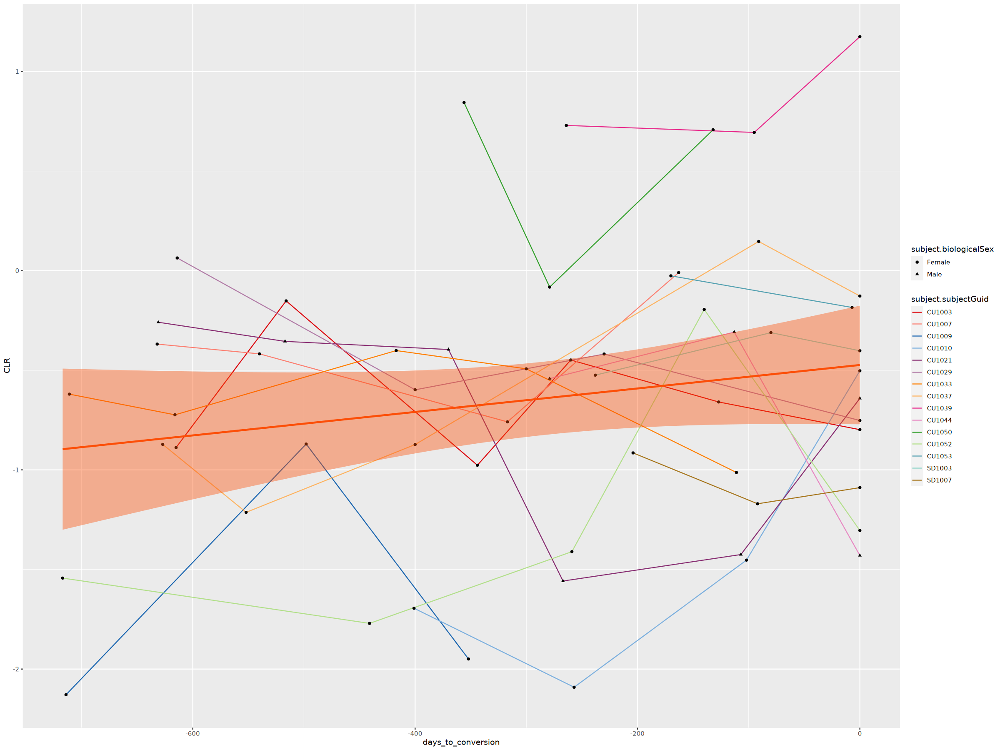

In [28]:
# plot cluster 8
p2 <- Bmem_freq_aim3 %>%filter(cell_type=='9') %>% ggplot(aes(x=days_to_conversion, y=`clr`)) +
    geom_line(aes(color=subject.subjectGuid)) + geom_point(aes(shape=subject.biologicalSex))+ 
    stat_smooth(
  color = "#FC4E07", fill = "#FC4E07",
  method = "lm"
  )  + scale_color_manual(values = cluster_colors)+ ylab('CLR') #+ ggpubr::theme_pubr()
p2
ggsave(file.path(fig_path, paste0(proj_name, 'cluster9_clr.png')), 
       width =5, height=4)

### plot fig 4c

In [52]:
# test the model in c9
formula_linear1 <- as.formula("clr ~ age_conv + bmi_conv + days_to_conversion + (1 |subject.subjectGuid)")
c9_freq = Bmem_freq_aim3%>%filter(cell_type=='9')%>% mutate(Sex=subject.biologicalSex)%>%filter(
          subject.biologicalSex=='Female')
c9_fit <- lmer(formula = formula_linear1,
                         data = c9_freq)
summary(c9_fit)

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: formula_linear1
   Data: c9_freq

REML criterion at convergence: 110.7

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-1.63453 -0.59367 -0.09119  0.46772  2.09607 

Random effects:
 Groups              Name        Variance Std.Dev.
 subject.subjectGuid (Intercept) 0.4676   0.6838  
 Residual                        0.1845   0.4295  
Number of obs: 50, groups:  subject.subjectGuid, 13

Fixed effects:
                     Estimate Std. Error         df t value Pr(>|t|)  
(Intercept)        -1.2576760  1.1476273  9.5981643  -1.096   0.2999  
age_conv            0.0082428  0.0156949  9.5530568   0.525   0.6114  
bmi_conv            0.0169051  0.0372853  9.5358423   0.453   0.6604  
days_to_conversion  0.0006281  0.0003180 38.9797405   1.975   0.0554 .
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fixed Effects:
            (Intr) ag_cnv bm_cn

In [53]:
#' Plot a frequency line plot with prediction
#'
#' This function takes a frequency table, a model fit, and various parameters to create a line plot with prediction.
#'
#' @param frequency_table A data frame containing the frequency data.
#' @param model_fit The model fit object.
#' @param palette A vector of colors for the line plot.
#' @param fig_path The file path to save the plot. Default is NULL.
#' @param fig_name The name of the figure Default is NULL.
#' @param x_var The variable for the x-axis. Default is "days_to_conversion".
#' @param y_var The variable for the y-axis. Default is "clr".
#' @param color_var The variable for coloring the lines. Default is "subject.subjectGuid".
#' @param shape_var The variable for shaping the points. Default is "sex".
#' @param title The title of the plot. Default is "Cluster 9".
#' @param x_label The label for the x-axis. Default is "Days to Conversion".
#' @param y_label The label for the y-axis. Default is "CLR".
#' @param annotation_text The text for the annotation. Default is "p=0.055".
#' @param annotation_x The x-coordinate for the annotation. Default is -600.
#' @param annotation_y The y-coordinate for the annotation. Default is 1.
#' @param annotation_color The color for the annotation. Default is "red".
#'
#' @return The plot object.
#'
#' @examples
#' # Example usage of PlotFreqLinePlot function
#' PlotFreqLinePlot(frequency_table, model_fit, palette, fig_path = "path/to/save", fig_name = "fig_name",
#'                  x_var = "days_to_conversion", y_var = "clr", color_var = "subject.subjectGuid",
#'                  shape_var = "sex", title = "Cluster 9", x_label = "Days to Conversion", 
#'                  y_label = "CLR", annotation_text = "p=0.055", annotation_x = -600, 
#'                  annotation_y = 1, annotation_color = "red")
#'
#' @export
PlotFreqLinePlot <- function(frequency_table, model_fit, palette, fig_path = NULL, fig_name = NULL,
                             x_var = "days_to_conversion", y_var = "clr", color_var = "subject.subjectGuid",
                             shape_var = "sex", title = "Cluster 9", x_label = "Days to Conversion", 
                             y_label = "CLR", annotation_text = "p=0.055", annotation_x = -600, 
                             annotation_y = 1, annotation_color = "red") {
    require(ggplot2)
    require(ggeffects)
    
    # Extract the prediction data frame
    pred.mm <- ggpredict(model_fit, terms = c(x_var))  # Adjusted to use x_var

    # plot
    p1 <- frequency_table %>%
        ggplot() +
        geom_line(aes(x = .data[[x_var]], y = .data[[y_var]], color = .data[[color_var]]), size = 1) + 
        geom_point(aes(x = .data[[x_var]], y = .data[[y_var]], shape = .data[[shape_var]])) + 
        geom_line(data=pred.mm, aes(x = x, y = predicted), color="#8F7700FF", size = 1.2) +          
        geom_ribbon(data=pred.mm, aes(x = x, ymin = predicted - std.error, ymax = predicted + std.error), 
                    fill = "#8F7700FF", alpha = 0.3, size = 1.2) + 
        annotate(geom="text", x= annotation_x, y=annotation_y, label=annotation_text, size = 6,
                    color=annotation_color) +
        labs(title = title) + xlab(x_label) +  ylab(y_label)+
        scale_color_manual(values = palette) + theme_minimal() +
        theme(
            text = element_text(size = 10, face = "bold"),  
            axis.title = element_text(size = 10, face = "bold"),  
            axis.text = element_text(size = 10, face = "bold"),  
            plot.title = element_text(size = 10, face = "bold"),  
            legend.position="top") +
        scale_shape_manual(values = c(1, 2))  + guides(color = 'none')
    
    # Code to save the plot if fig_path and proj_name are provided
        # Check if fig_path and proj_name are provided and not empty
    if (!missing(fig_path) && !missing(fig_name) && nzchar(fig_path) && nzchar(fig_name)) {
        # Construct the full file path with the project name and desired file extension
        file_name <- paste0(fig_path, "/", fig_name)
        # Use ggsave to save the plot
        ggsave(file_name, plot = p1, width = 4, height = 4, dpi = 300)
    }
    return(p1)
}


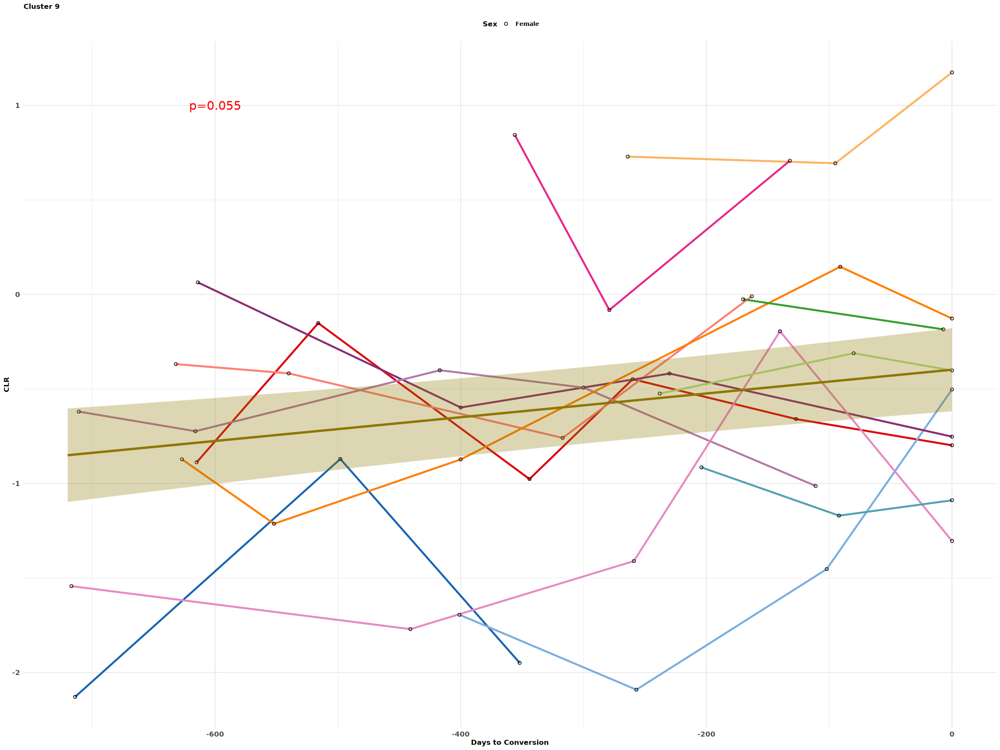

In [54]:
PlotFreqLinePlot(c9_freq, model_fit=c9_fit, palette=cluster_colors,
                 fig_path = fig_path, fig_name = paste0(proj_name, "c9_lineplot.png"),
                  x_var = "days_to_conversion", y_var = "clr", color_var = "subject.subjectGuid",
                  shape_var = "Sex", title = "Cluster 9", x_label = "Days to Conversion", 
                  y_label = "CLR", annotation_text = "p=0.055", annotation_x = -600, 
                  annotation_y = 1, annotation_color = "red")

In [55]:
# test the model in c8
c8_freq <- Bmem_freq_aim3%>%filter(cell_type=='8')%>%filter(
          subject.biologicalSex=='Female')
c8_fit <- lmer(formula = formula_linear1,
                         data = c8_freq)
summary(c8_fit)

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: formula_linear1
   Data: c8_freq

REML criterion at convergence: 85.8

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-2.00501 -0.57260  0.01864  0.62199  1.58245 

Random effects:
 Groups              Name        Variance Std.Dev.
 subject.subjectGuid (Intercept) 0.2954   0.5435  
 Residual                        0.1052   0.3244  
Number of obs: 50, groups:  subject.subjectGuid, 13

Fixed effects:
                     Estimate Std. Error         df t value Pr(>|t|)
(Intercept)        -1.3554163  0.9080131  9.6907114  -1.493    0.167
age_conv            0.0179319  0.0124193  9.6484115   1.444    0.180
bmi_conv           -0.0071486  0.0295047  9.6336089  -0.242    0.814
days_to_conversion  0.0002234  0.0002407 38.7833780   0.928    0.359

Correlation of Fixed Effects:
            (Intr) ag_cnv bm_cnv
age_conv    -0.431              
bmi_conv    -0.756 -0.236       
dys_t_cnvr

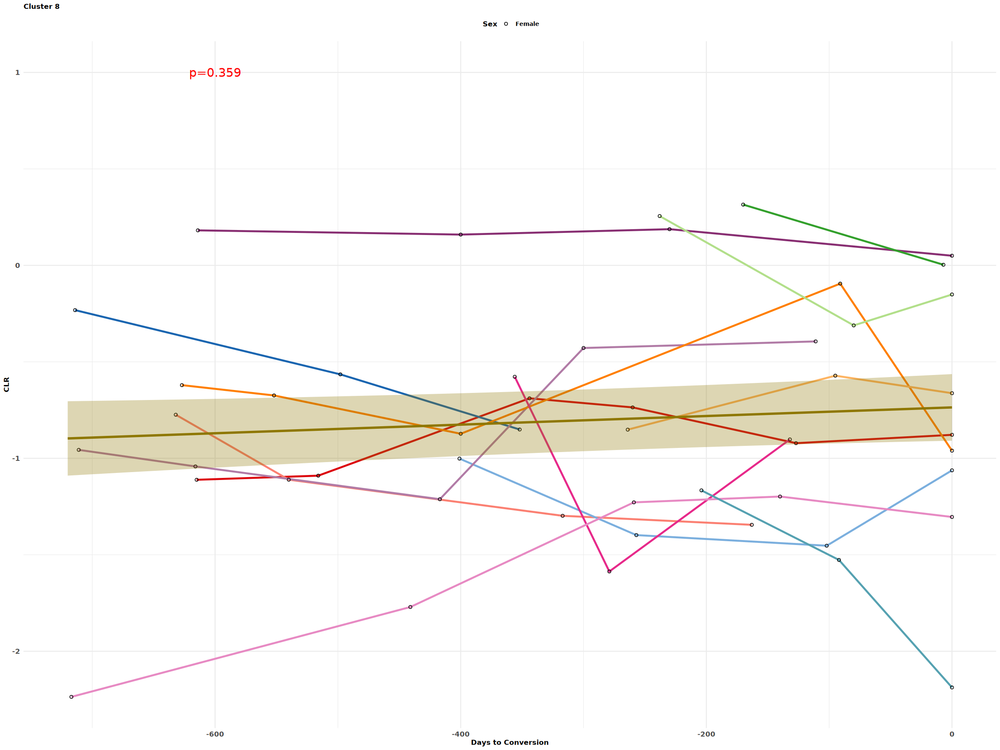

In [56]:
# take one cell type to model first
PlotFreqLinePlot(c8_freq %>% mutate(Sex=subject.biologicalSex), model_fit=c8_fit, palette=cluster_colors,
                 fig_path = fig_path, fig_name = paste0(proj_name, "C8_lineplot.png"),
                  x_var = "days_to_conversion", y_var = "clr", color_var = "subject.subjectGuid",
                  shape_var = "Sex", title = "Cluster 8", x_label = "Days to Conversion", 
                  y_label = "CLR", annotation_text = "p=0.359", annotation_x = -600, 
                  annotation_y = 1, annotation_color = "red")

In [47]:
# adjustment in B mem C8 and C9
p = c(0.055, 0.359)
p.adjust(p, method = 'BH')

[1] 0.110 0.359

### check the tfh and the B effector correlation

In [15]:
# load the th frequency
th_freq = read_csv('/home/workspace/data/ra_longitudinal/output_results/CD4t/AA_CD4_T_without_Naive_FRQ_CLR.csv',
                  show_col_types = FALSE)
th_freq%>%colnames()

[1] "sample.sampleKitGuid"  "BMI"                   "days_to_conversion"   
 [4] "subject.biologicalSex" "subject.subjectGuid"   "bmi_conv"             
 [7] "age_conv"              "Status_Long"           "Status_Xsec"          
[10] "clusters"              "frequency_live"        "clr"

In [16]:
Bmem_freq%>%colnames()

[1] "sample.sampleKitGuid"    "cell_type"              
 [3] "bmem_frequency"          "subject.subjectGuid"    
 [5] "subject.biologicalSex"   "days_to_conversion"     
 [7] "status"                  "age"                    
 [9] "file.batchID"            "Status_Long"            
[11] "age_conv"                "bmi_conv"               
[13] "BMI"                     "anti_ccp3_finalCombined"
[15] "Status_Xsec"             "counts"                 
[17] "bmem_counts"             "total_b_counts"         
[19] "b_frequency"             "pseudo_count"           
[21] "pseudo_b_counts"         "pseudo_b_frequency"     
[23] "pseudo_clr"

In [17]:
# join the th and b effector frequqncy
th_beff_freq = th_freq %>%filter(clusters!='Th17_Treg_ratio') %>% select(all_of(c('sample.sampleKitGuid','clusters','frequency_live','clr')))%>%
    inner_join(Bmem_freq%>%filter(cell_type=='8'), by='sample.sampleKitGuid')
th_beff_freq%>%head()

sample.sampleKitGuid,clusters,frequency_live,clr,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,days_to_conversion,status,⋯,anti_ccp3_finalCombined,Status_Xsec,counts,bmem_counts,total_b_counts,b_frequency,pseudo_count,pseudo_b_counts,pseudo_b_frequency,pseudo_clr
<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,⋯,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
KT00052,Cytotoxic,0.004919185,-2.8211382,8,0.02398082,CU1009,Female,-714,at_risk,⋯,88,at_risk,10,417,1476,0.006775068,11,1491,0.007377599,-0.4923388
KT00052,Th17,0.091356290,0.1004861,8,0.02398082,CU1009,Female,-714,at_risk,⋯,88,at_risk,10,417,1476,0.006775068,11,1491,0.007377599,-0.4923388
KT00052,TFH,0.009135629,-2.2020990,8,0.02398082,CU1009,Female,-714,at_risk,⋯,88,at_risk,10,417,1476,0.006775068,11,1491,0.007377599,-0.4923388
KT00052,Tmemory,0.588896697,1.9639698,8,0.02398082,CU1009,Female,-714,at_risk,⋯,88,at_risk,10,417,1476,0.006775068,11,1491,0.007377599,-0.4923388
KT00052,Treg,0.186694776,0.8151941,8,0.02398082,CU1009,Female,-714,at_risk,⋯,88,at_risk,10,417,1476,0.006775068,11,1491,0.007377599,-0.4923388
KT00052,TH1,0.118997423,0.3648208,8,0.02398082,CU1009,Female,-714,at_risk,⋯,88,at_risk,10,417,1476,0.006775068,11,1491,0.007377599,-0.4923388


In [18]:
th_beff_freq%>%group_by(clusters)%>%tally()

clusters,n
<chr>,<int>
Cytotoxic,141
TFH,141
TH1,141
Th17,141
Tmemory,141
Treg,141


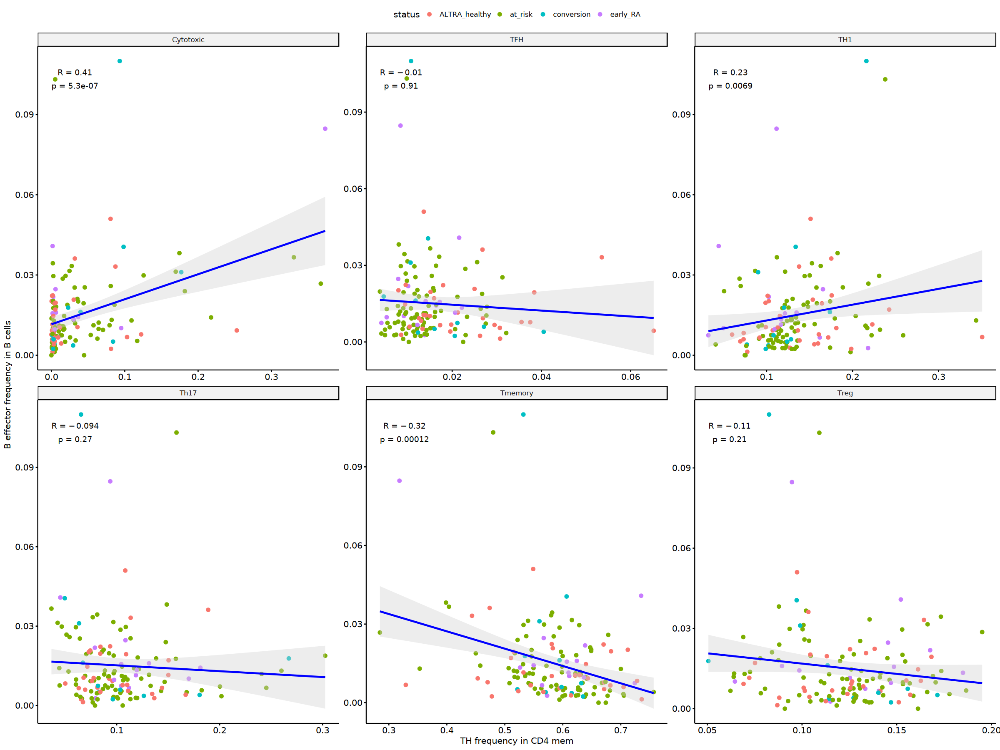

In [27]:
# plot the correlation
th_beff_freq%>%#filter(clusters=='TFH')%>%
   ggpubr::ggscatter(x='frequency_live', y='b_frequency',
                     color =  'status',
                     xlab = 'TH frequency in CD4 mem',
  ylab = 'B effector frequency in B cells',
                              add = "reg.line",  # Add regressin line
   add.params = list(color = "blue", fill = "lightgray"), # Customize reg. line
   conf.int = TRUE, # Add confidence interval
   cor.coef = TRUE, # Add correlation coefficient. see ?stat_cor
   cor.coeff.args = list(method = "spearman", label.sep = "\n")) +
    facet_wrap(vars(clusters), scales = 'free')
ggsave(file.path(fig_path, paste0(proj_name, 'tbet_effector_cd4t_correlations.png')), 
       width=12, height=6)

In [20]:
th_beff_freq%>%filter(!is.na(Status_Long) & status=='early_RA'| subject.subjectGuid=='CU1053')

sample.sampleKitGuid,clusters,frequency_live,clr,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,days_to_conversion,status,⋯,anti_ccp3_finalCombined,Status_Xsec,counts,bmem_counts,total_b_counts,b_frequency,pseudo_count,pseudo_b_counts,pseudo_b_frequency,pseudo_clr
<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,⋯,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
KT00468,Cytotoxic,0.006453423,-2.7707460,8,0.05841446,CU1053,Female,-170,at_risk,⋯,39,at_risk,42,719,2317,0.01812689,43,2332,0.01843911,0.3684024
KT00468,Th17,0.120370370,0.1552167,8,0.05841446,CU1053,Female,-170,at_risk,⋯,39,at_risk,42,719,2317,0.01812689,43,2332,0.01843911,0.3684024
KT00468,TFH,0.014309764,-1.9744146,8,0.05841446,CU1053,Female,-170,at_risk,⋯,39,at_risk,42,719,2317,0.01812689,43,2332,0.01843911,0.3684024
KT00468,Tmemory,0.623176207,1.7994726,8,0.05841446,CU1053,Female,-170,at_risk,⋯,39,at_risk,42,719,2317,0.01812689,43,2332,0.01843911,0.3684024
KT00468,Treg,0.087542088,-0.1632370,8,0.05841446,CU1053,Female,-170,at_risk,⋯,39,at_risk,42,719,2317,0.01812689,43,2332,0.01843911,0.3684024
KT00468,TH1,0.148148148,0.3628561,8,0.05841446,CU1053,Female,-170,at_risk,⋯,39,at_risk,42,719,2317,0.01812689,43,2332,0.01843911,0.3684024
KT02856,Cytotoxic,0.006104034,-2.8277492,8,0.04718218,CU1053,Female,-7,early_RA,⋯,43,early_RA,36,763,2257,0.01595038,37,2272,0.01628521,0.2294053
KT02856,Th17,0.131369427,0.2413143,8,0.04718218,CU1053,Female,-7,early_RA,⋯,43,early_RA,36,763,2257,0.01595038,37,2272,0.01628521,0.2294053
KT02856,TFH,0.014065817,-1.9929515,8,0.04718218,CU1053,Female,-7,early_RA,⋯,43,early_RA,36,763,2257,0.01595038,37,2272,0.01628521,0.2294053


In [24]:
th_beff_freq%>%colnames()

[1] "sample.sampleKitGuid"    "clusters"               
 [3] "frequency_live"          "clr"                    
 [5] "cell_type"               "bmem_frequency"         
 [7] "subject.subjectGuid"     "subject.biologicalSex"  
 [9] "days_to_conversion"      "status"                 
[11] "age"                     "file.batchID"           
[13] "Status_Long"             "age_conv"               
[15] "bmi_conv"                "BMI"                    
[17] "anti_ccp3_finalCombined" "Status_Xsec"            
[19] "counts"                  "bmem_counts"            
[21] "total_b_counts"          "b_frequency"            
[23] "pseudo_count"            "pseudo_b_counts"        
[25] "pseudo_b_frequency"      "pseudo_clr"

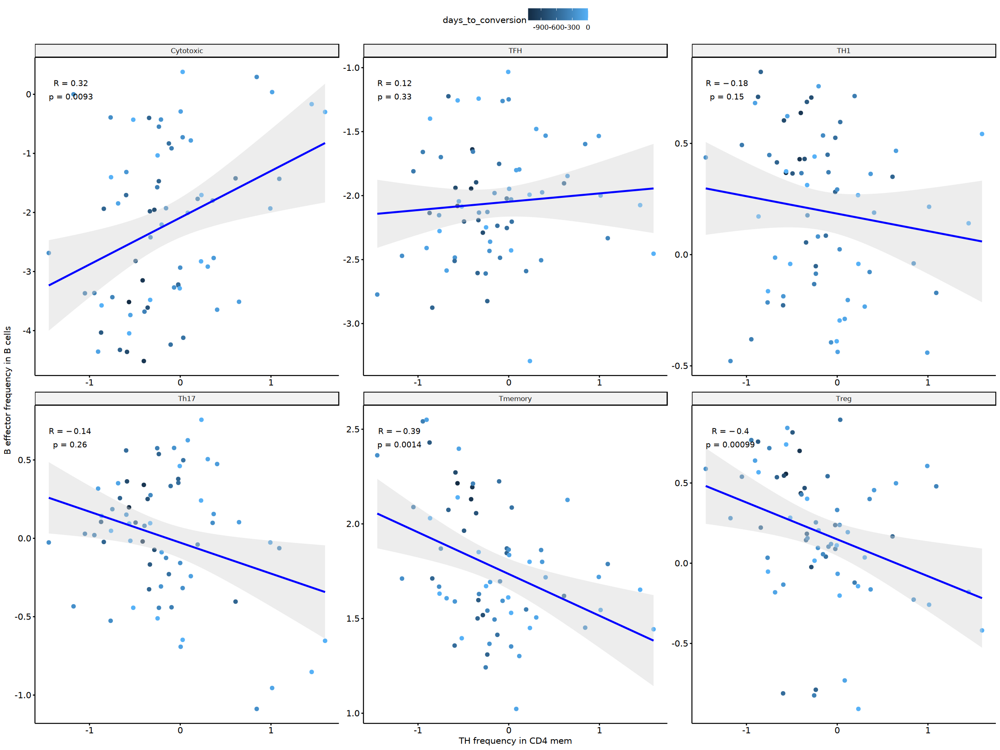

In [26]:
# plot the correlation
th_beff_freq%>%filter(!is.na(Status_Long))%>% 
   ggpubr::ggscatter(x='pseudo_clr', y='clr',
                     color =  'days_to_conversion',
                     xlab = 'TH frequency in CD4 mem',
  ylab = 'B effector frequency in B cells',
                              add = "reg.line",  # Add regressin line
   add.params = list(color = "blue", fill = "lightgray"), # Customize reg. line
   conf.int = TRUE, # Add confidence interval
   cor.coef = TRUE, # Add correlation coefficient. see ?stat_cor
   cor.coeff.args = list(method = "spearman", label.sep = "\n")) +
    facet_wrap(vars(clusters), scales = 'free')
# ggsave(file.path(fig_path, paste0(proj_name, 'tbet_effector_cd4t_correlations_convertors.png')), 
#        width=12, height=6)

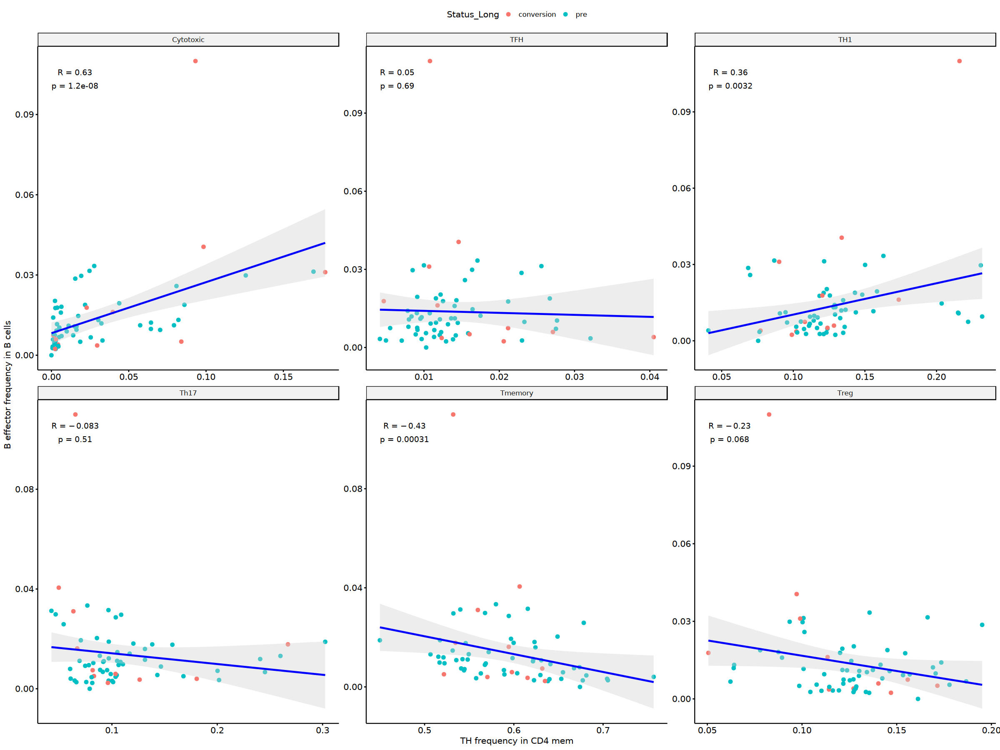

In [22]:
# plot the correlation
th_beff_freq%>%filter(!is.na(Status_Long))%>% 
   ggpubr::ggscatter(x='frequency_live', y='b_frequency',
                     color =  'Status_Long',
                     xlab = 'TH frequency in CD4 mem',
  ylab = 'B effector frequency in B cells',
                              add = "reg.line",  # Add regressin line
   add.params = list(color = "blue", fill = "lightgray"), # Customize reg. line
   conf.int = TRUE, # Add confidence interval
   cor.coef = TRUE, # Add correlation coefficient. see ?stat_cor
   cor.coeff.args = list(method = "spearman", label.sep = "\n")) +
    facet_wrap(vars(clusters), scales = 'free')
ggsave(file.path(fig_path, paste0(proj_name, 'tbet_effector_cd4t_correlations_convertors.png')), 
       width=12, height=6)

## run pair analysis for DA

In [44]:
# subset the data to pair analysis pre and post conversion
paired_meta = read_csv('/home/workspace/data/ra_longitudinal/output_results/AIM3_paired_pre_post_conversion_samples.csv')
paired_meta%>%head()

Rows: 22 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (6): subject.subjectGuid, sample.sampleKitGuid, file.batchID, sample.di...
dbl  (2): days_to_conversion, pair_number
date (1): sample.drawDate

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


subject.subjectGuid,sample.drawDate,sample.sampleKitGuid,file.batchID,sample.diseaseStatesRecordedAtVisit,Status_Long,days_to_conversion,pair_number,status
<chr>,<date>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>
CU1003,2021-02-01,KT00493,B176,Rheumatoid arthritis,pre,-127,2,pre_conv
CU1003,2021-06-01,KT02135,B087,Rheumatoid arthritis,conversion,0,2,conversion
CU1010,2022-09-01,KT04474,B178,Rheumatoid arthritis,pre,-102,2,pre_conv
CU1010,2023-01-01,KT04108,B164,CCP3+ At Risk for RA,conversion,0,2,conversion
CU1021,2022-08-01,KT04105,B140,Rheumatoid arthritis,pre,-107,2,pre_conv
CU1021,2022-11-01,KT04462,B158,Rheumatoid arthritis,conversion,0,2,conversion


In [45]:
# subset the frequency table to the pair comparison
Bmem_freq_pair <- Bmem_freq %>%
    filter(sample.sampleKitGuid%in%paired_meta$sample.sampleKitGuid)%>%
    select(-status)%>%left_join(select(paired_meta, c(status, sample.sampleKitGuid)), by='sample.sampleKitGuid')%>%
    mutate(status=factor(status, levels = c('pre_conv', 'conversion')))
Bmem_freq_pair%>%colnames()

[1] "sample.sampleKitGuid"    "cell_type"              
 [3] "bmem_frequency"          "subject.subjectGuid"    
 [5] "subject.biologicalSex"   "days_to_conversion"     
 [7] "age"                     "file.batchID"           
 [9] "Status_Long"             "age_conv"               
[11] "bmi_conv"                "BMI"                    
[13] "anti_ccp3_finalCombined" "Status_Xsec"            
[15] "counts"                  "bmem_counts"            
[17] "total_b_counts"          "b_frequency"            
[19] "pseudo_count"            "pseudo_b_counts"        
[21] "pseudo_b_frequency"      "pseudo_clr"             
[23] "status"

In [46]:
Bmem_freq_pair%>%distinct(sample.sampleKitGuid, .keep_all = TRUE)%>%group_by(status)%>%tally()


status,n
<fct>,<int>
pre_conv,11
conversion,11


In [47]:
 # run wilcox test for frequency pretreatment vs healthy 
freq_stats_wilcox_pair <- Bmem_freq_pair %>%
    group_by(cell_type) %>% arrange(subject.subjectGuid)%>%
    rstatix::wilcox_test(data =., pseudo_clr ~ status, paired = TRUE) %>%
      rstatix::adjust_pvalue(method = "BH") %>%
      rstatix::add_significance("p.adj") 
freq_stats_wilcox_pair_sig = freq_stats_wilcox_pair %>% arrange(p)%>%filter(p<0.05)
freq_stats_wilcox_pair_sig

cell_type,.y.,group1,group2,n1,n2,statistic,p,p.adj,p.adj.signif
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>
10,pseudo_clr,pre_conv,conversion,11,11,61,0.00977,0.14655,ns
13,pseudo_clr,pre_conv,conversion,11,11,9,0.03220,0.24150,ns


In [51]:
freq_stats_wilcox_pair

cell_type,.y.,group1,group2,n1,n2,statistic,p,p.adj,p.adj.signif
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>
0,pseudo_clr,pre_conv,conversion,11,11,28,0.70000,0.8750000,ns
1,pseudo_clr,pre_conv,conversion,11,11,16,0.14700,0.5512500,ns
10,pseudo_clr,pre_conv,conversion,11,11,61,0.00977,0.1465500,ns
11,pseudo_clr,pre_conv,conversion,11,11,22,0.36500,0.7750000,ns
12,pseudo_clr,pre_conv,conversion,11,11,29,0.76500,0.8826923,ns
13,pseudo_clr,pre_conv,conversion,11,11,9,0.03220,0.2415000,ns
2,pseudo_clr,pre_conv,conversion,11,11,40,0.57700,0.8655000,ns
3,pseudo_clr,pre_conv,conversion,11,11,42,0.46500,0.7750000,ns
4,pseudo_clr,pre_conv,conversion,11,11,32,0.96600,0.9660000,ns


In [48]:
# il1b_cd16_freq_pre = Bmem_freq_pair %>% filter(cell_type == 'IL1B+ CD14 monocyte_CD16mono'&
#                             status=='pre')%>% arrange(subject.subjectGuid)
# il1b_cd16_freq_conv = Bmem_freq_pair %>% filter(cell_type == 'IL1B+ CD14 monocyte_CD16mono'&
#                             status=='conversion')%>% arrange(subject.subjectGuid)
# wilcox.test(il1b_cd16_freq_pre$frequency, 
#             il1b_cd16_freq_conv$frequency, 
#             paired = TRUE, alternative = "two.sided")

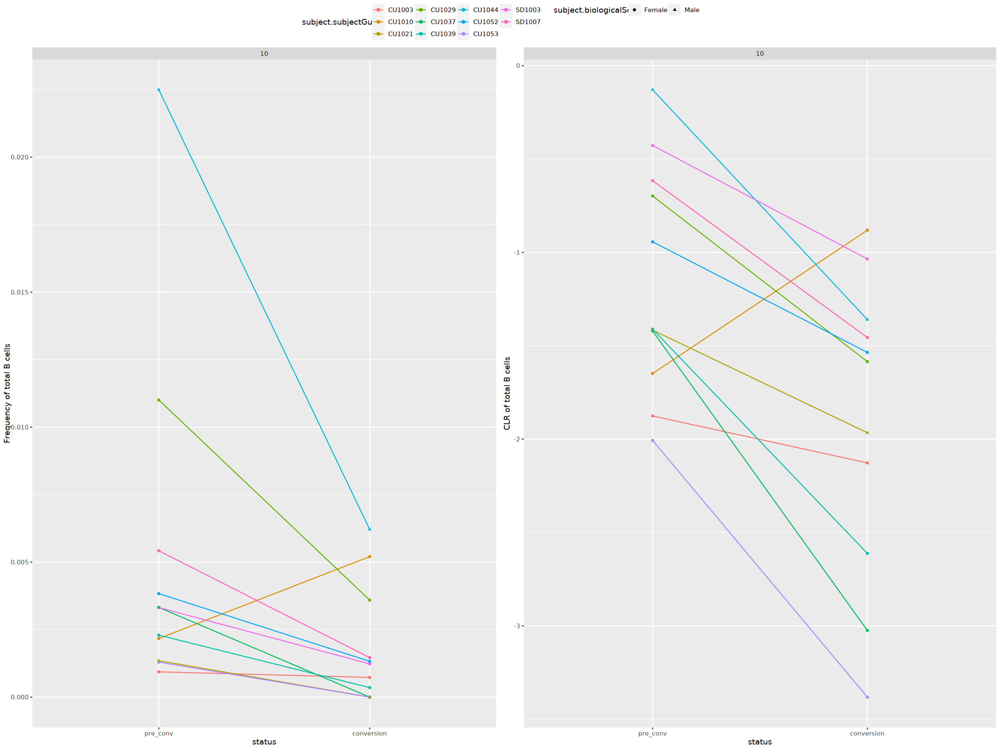

In [49]:

p1<- Bmem_freq_pair %>% filter(cell_type =='10') %>% 
    ggplot(aes(x=status, y=b_frequency, color=subject.subjectGuid, group=subject.subjectGuid))+
   geom_point(aes(shape=subject.biologicalSex)) + geom_line() + facet_wrap(vars(cell_type), scales = 'free_y') + 
    ylab('Frequency of total B cells')
p2<- Bmem_freq_pair %>% filter(cell_type =='10') %>%
    ggplot(aes(x=status, y=pseudo_clr, color=subject.subjectGuid, group=subject.subjectGuid))+
   geom_point(aes(shape=subject.biologicalSex)) + geom_line() + facet_wrap(vars(cell_type), scales = 'free_y') + 
    ylab('CLR of total B cells')
ggpubr::ggarrange(p1, p2, common.legend = TRUE)
ggsave(file.path(fig_path, paste0(proj_name, '_cluster10_paired_B_frequency_clr.png')), width=8, height=4)

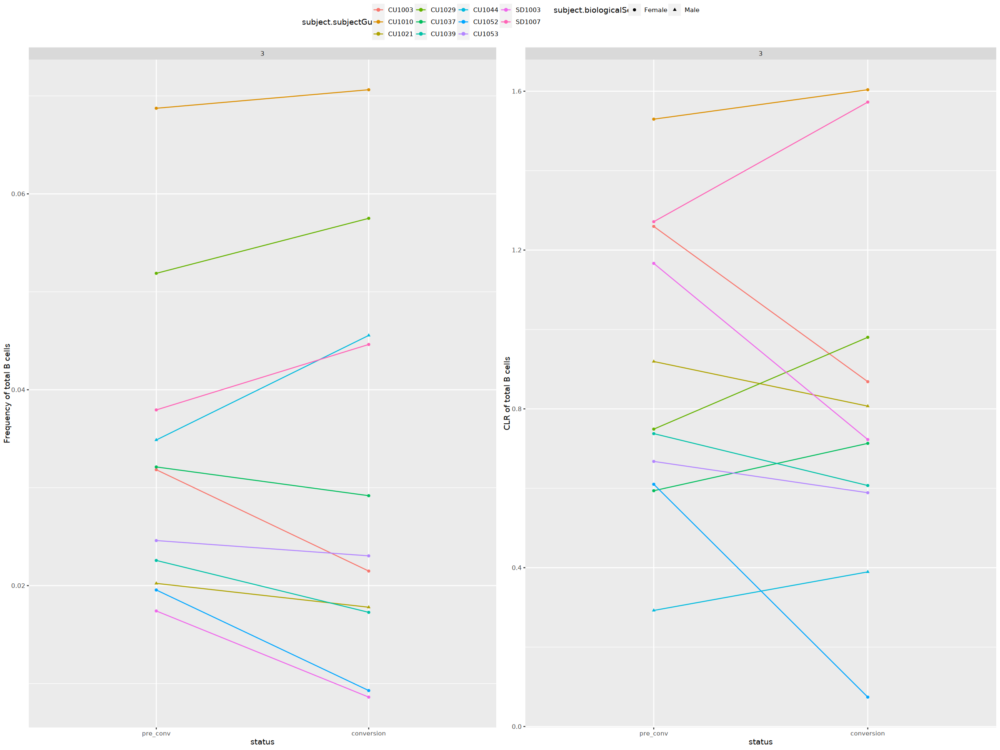

In [50]:

p1<- Bmem_freq_pair %>% filter(cell_type =='3') %>% 
    ggplot(aes(x=status, y=b_frequency, color=subject.subjectGuid, group=subject.subjectGuid))+
   geom_point(aes(shape=subject.biologicalSex)) + geom_line() + facet_wrap(vars(cell_type), scales = 'free_y') + 
    ylab('Frequency of total B cells')
p2<- Bmem_freq_pair %>% filter(cell_type =='3') %>%
    ggplot(aes(x=status, y=pseudo_clr, color=subject.subjectGuid, group=subject.subjectGuid))+
   geom_point(aes(shape=subject.biologicalSex)) + geom_line() + facet_wrap(vars(cell_type), scales = 'free_y') + 
    ylab('CLR of total B cells')
ggpubr::ggarrange(p1, p2, common.legend = TRUE)
ggsave(file.path(fig_path, paste0(proj_name, '_cluster3_paired_B_frequency_clr.png')), width=8, height=4)

# add BRI longitudinal data for comparison

In [82]:
fig_path = '/home/workspace/data/immune_health/figures/Bmem'

In [83]:
# load frequency
BRI_Bmem_freq = read_csv('/home/workspace/data/immune_health/output_results/Bmem/BRI_scRNA_Bmem_B_mem_effector_leiden_1_sub_freq.csv',
                       col_select = -1, show_col_types = FALSE)
BRI_Bmem_freq %>% head()
BRI_Bmem_freq %>% distinct(sample.sampleKitGuid)%>%nrow()

New names:
• `` -> `...1`


sample.sampleKitGuid,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,age,sample.drawDate,sample.daysSinceFirstVisit,sample.diseaseStatesRecordedAtVisit,days_since_first,total_b_counts,file.batchID,counts,bmem_counts,b_frequency
<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<lgl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>
KT00003,0,0.05977011,BR1003,Female,30,2019-10,0,NA,"[0,10)",1729,B001,26,435,0.015037594
KT00012,0,0.04545455,BR1008,Female,34,2019-10,0,NA,"[0,10)",1340,B002,11,242,0.008208955
KT00016,0,0.03992740,BR2002,Female,57,2019-11,0,NA,"[0,10)",1418,B002,22,551,0.015514810
KT00022,0,0.07865169,BR1010,Female,29,2019-11,0,NA,"[0,10)",548,B002,14,178,0.025547445
KT00030,0,0.03727715,BR1013,Female,31,2019-12,0,NA,"[0,10)",1270,B078,23,617,0.018110236
KT00039,0,0.01780415,BR1024,Female,35,2020-01,0,NA,"[0,10)",750,B182,6,337,0.008000000


[1] 86

In [84]:
BRI_Bmem_freq%>%distinct(cell_type)

cell_type
<chr>
0
1_0
1_1
2
3
4
5
6
7


In [85]:
# remove BR2024 from the analysis
BRI_Bmem_freq %>% filter(subject.subjectGuid=='BR2024')

sample.sampleKitGuid,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,age,sample.drawDate,sample.daysSinceFirstVisit,sample.diseaseStatesRecordedAtVisit,days_since_first,total_b_counts,file.batchID,counts,bmem_counts,b_frequency
<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<lgl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>


In [86]:
BRI_Bmem_freq %>% distinct(sample.sampleKitGuid)%>%nrow()

[1] 86

In [87]:
# load the samples selection
bri_meta = read_csv('/home/workspace/data/immune_health/BRI_longitudinal_matching_converters.csv')
bri_meta%>%colnames()

Rows: 89 Columns: 41
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (25): sample.id, sample.sampleKitGuid, sample.visitName, sample.visitDe...
dbl   (7): ...1, X, sample.daysSinceFirstVisit, file.majorVersion, subject.b...
lgl   (4): sample.bridgingControl, file.panel, sample.diseaseStatesRecordedA...
dttm  (2): lastUpdated, sample.drawDate
date  (3): Sample_Draw_date, Covid_Dose_1, Covid_Dose_2

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] "...1"                                  
 [2] "X"                                     
 [3] "lastUpdated"                           
 [4] "sample.id"                             
 [5] "sample.bridgingControl"                
 [6] "sample.sampleKitGuid"                  
 [7] "sample.visitName"                      
 [8] "sample.visitDetails"                   
 [9] "sample.drawDate"                       
[10] "sample.daysSinceFirstVisit"            
[11] "file.id"                               
[12] "file.name"                             
[13] "file.batchID"                          
[14] "file.panel"                            
[15] "file.pool"                             
[16] "file.fileType"                         
[17] "file.majorVersion"                     
[18] "subject.id"                            
[19] "subject.biologicalSex"                 
[20] "subject.birthYear"                     
[21] "subject.ethnicity"                     
[22] "subject.partnerCode"                   
[23] "subject.race"                          
[24] "subject.subjectGuid"                   
[25] "cohort.cohortGuid"                     
[26] "sample.diseaseStatesRecordedAtVisit"   
[27] "pbmc_sample_id"                        
[28] "Sample_ID"                             
[29] "Sample_Draw_date"                      
[30] "Covid_Dose_1"                          
[31] "Covid_Dose_2"                          
[32] "Covid_exlcusion"                       
[33] "CMV.IgG.Serology.Result.Interpretation"
[34] "BMI"                                   
[35] "file.name.downloaded"                  
[36] "file.path"                             
[37] "sample_numbers"                        
[38] "age"                                   
[39] "days_since_first"                      
[40] "file_name"                             
[41] "file_path"

In [88]:
# add metadata 
BRI_Bmem_freq <- BRI_Bmem_freq%>%left_join(select(bri_meta, c(sample.sampleKitGuid,BMI)), by='sample.sampleKitGuid')

In [89]:
BRI_Bmem_freq%>%head()

sample.sampleKitGuid,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,age,sample.drawDate,sample.daysSinceFirstVisit,sample.diseaseStatesRecordedAtVisit,days_since_first,total_b_counts,file.batchID,counts,bmem_counts,b_frequency,BMI
<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<lgl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>
KT00003,0,0.05977011,BR1003,Female,30,2019-10,0,NA,"[0,10)",1729,B001,26,435,0.015037594,<25-BMI
KT00012,0,0.04545455,BR1008,Female,34,2019-10,0,NA,"[0,10)",1340,B002,11,242,0.008208955,>30BMI
KT00016,0,0.03992740,BR2002,Female,57,2019-11,0,NA,"[0,10)",1418,B002,22,551,0.015514810,<25-BMI
KT00022,0,0.07865169,BR1010,Female,29,2019-11,0,NA,"[0,10)",548,B002,14,178,0.025547445,<25-BMI
KT00030,0,0.03727715,BR1013,Female,31,2019-12,0,NA,"[0,10)",1270,B078,23,617,0.018110236,<25-BMI
KT00039,0,0.01780415,BR1024,Female,35,2020-01,0,NA,"[0,10)",750,B182,6,337,0.008000000,<25-BMI


In [90]:
# add last BMI, age and last_visit_day for BRI
bri_meta_age_bmi <- BRI_Bmem_freq %>% 
        group_by(subject.subjectGuid)%>%slice_max(order_by = sample.daysSinceFirstVisit)%>%
        mutate(age_last=age, bmi_last = BMI)%>%select(subject.subjectGuid, age_last, bmi_last, 
                                                      sample.daysSinceFirstVisit)%>%
        rename('last_visit_day'='sample.daysSinceFirstVisit')%>%distinct(.keep_all = TRUE)
# add days_since_last for BRI
BRI_Bmem_freq<- BRI_Bmem_freq %>%left_join(bri_meta_age_bmi, by='subject.subjectGuid',
                                       relationship = "many-to-one")%>%
        mutate(days_since_last=sample.daysSinceFirstVisit-last_visit_day)

In [91]:
BRI_Bmem_freq%>%head()
BRI_Bmem_freq%>%distinct(cell_type)

sample.sampleKitGuid,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,age,sample.drawDate,sample.daysSinceFirstVisit,sample.diseaseStatesRecordedAtVisit,days_since_first,total_b_counts,file.batchID,counts,bmem_counts,b_frequency,BMI,age_last,bmi_last,last_visit_day,days_since_last
<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<lgl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
KT00003,0,0.05977011,BR1003,Female,30,2019-10,0,NA,"[0,10)",1729,B001,26,435,0.015037594,<25-BMI,32,NA,618,-618
KT00012,0,0.04545455,BR1008,Female,34,2019-10,0,NA,"[0,10)",1340,B002,11,242,0.008208955,>30BMI,35,>30BMI,330,-330
KT00016,0,0.03992740,BR2002,Female,57,2019-11,0,NA,"[0,10)",1418,B002,22,551,0.015514810,<25-BMI,59,NA,751,-751
KT00022,0,0.07865169,BR1010,Female,29,2019-11,0,NA,"[0,10)",548,B002,14,178,0.025547445,<25-BMI,31,NA,736,-736
KT00030,0,0.03727715,BR1013,Female,31,2019-12,0,NA,"[0,10)",1270,B078,23,617,0.018110236,<25-BMI,33,NA,724,-724
KT00039,0,0.01780415,BR1024,Female,35,2020-01,0,NA,"[0,10)",750,B182,6,337,0.008000000,<25-BMI,36,NA,618,-618


cell_type
<chr>
0
1_0
1_1
2
3
4
5
6
7


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


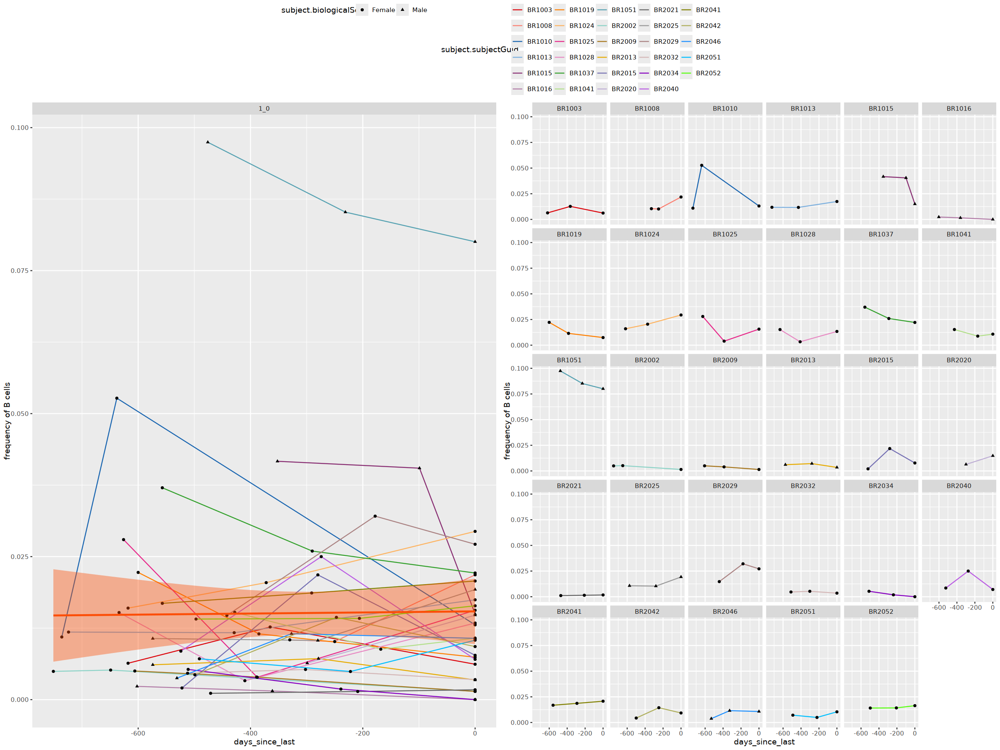

In [92]:
# take one cell type to model first
effector_freq <- BRI_Bmem_freq%>%filter(cell_type=='1_0')
p2 <- effector_freq %>% ggplot(aes(x=days_since_last, y=`b_frequency`)) +
    geom_line(aes(color=subject.subjectGuid)) + geom_point(aes(shape=subject.biologicalSex))+ 
    stat_smooth(
  color = "#FC4E07", fill = "#FC4E07",
  method = "lm"
  ) + facet_wrap(vars(cell_type), scales = 'free_y') + scale_color_manual(values = cluster_colors)+ ylab('frequency of B cells')

p3 <- effector_freq %>%  ggplot(aes(x=days_since_last, y=`b_frequency`)) +
    geom_line(aes(color=subject.subjectGuid)) + geom_point(aes(shape=subject.biologicalSex)) + 
    facet_wrap(vars(subject.subjectGuid)) + 
    scale_color_manual(values = cluster_colors)+ ylab('frequency of B cells')
ggpubr::ggarrange(p2, p3, common.legend = TRUE)
ggsave(file.path(fig_path, paste0(proj_name, 'BRI_switched_effectors_b_frequency.png')), 
       width =12, height=6)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


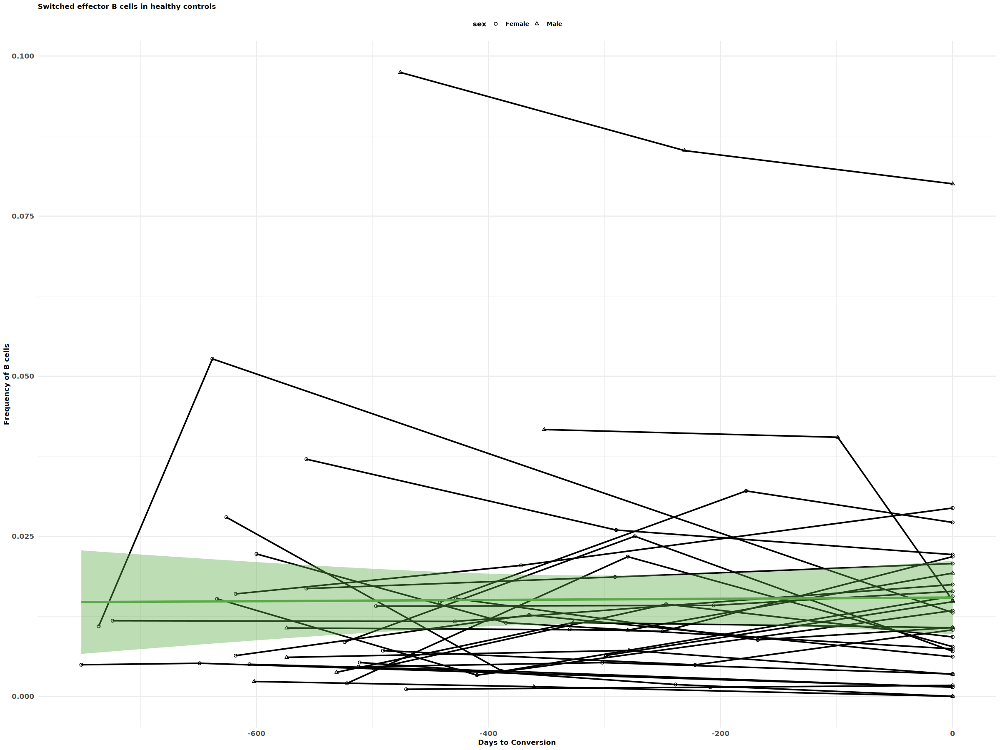

In [93]:
# plot the frequency
p1 <- effector_freq %>% mutate(cohort='Control2') %>% mutate(sex=subject.biologicalSex) %>%
  ggplot(aes(x = days_since_last, y = b_frequency)) +
  geom_line(aes(group=subject.subjectGuid),size = 0.8) + 
  geom_point(aes(shape = sex)) + 
  stat_smooth(
        method = "lm",
        color = "#5AAA46",  # Color for the lm line
        fill = "#5AAA46",  # Fill color for the confidence interval
        size = 1.2           # Thickness of the lm line
  ) + 
  labs(title = "Switched effector B cells in healthy controls") + xlab('Days to Conversion') +  ylab('Frequency of B cells')+
  scale_color_manual(values = cluster_colors) + theme_minimal() +
  theme(
    text = element_text(size = 10, face = "bold"),  # Set font size and style for all text
    axis.title = element_text(size = 10, face = "bold"),  # Set font size and style for axis titles
    axis.text = element_text(size = 10, face = "bold"),  # Set font size and style for axis labels
    plot.title = element_text(size = 10, face = "bold"),  # Set font size and style for plot title
    legend.position="top") +
  scale_shape_manual(values = c(1, 2))  + guides(color = FALSE) 
 # Assigning different shapes to 'male' and 'female'
  #facet_wrap(~ clusters)  # Faceting by the 'clusters' column
p1
ggsave(file.path(fig_path, paste0(proj_name, 'BRI_Switched_effecter_B_frequency.pdf')), 
       width =4, height=4)

## calculate CLR

In [94]:
BRI_Bmem_freq %>% distinct(cell_type)

cell_type
<chr>
0
1_0
1_1
2
3
4
5
6
7


In [95]:
BRI_Bmem_freq %>% group_by(sample.sampleKitGuid) %>% 
    mutate(sum_counts=sum(counts))%>%select(sum_counts, bmem_counts, total_b_counts)

Adding missing grouping variables: `sample.sampleKitGuid`


sample.sampleKitGuid,sum_counts,bmem_counts,total_b_counts
<chr>,<dbl>,<dbl>,<dbl>
KT00003,435,435,1729
KT00012,242,242,1340
KT00016,551,551,1418
KT00022,178,178,548
KT00030,617,617,1270
KT00039,337,337,750
KT00047,287,287,1576
KT00048,330,330,715
KT00149,360,360,576


In [96]:
BRI_Bmem_freq %>% group_by(sample.sampleKitGuid) %>% 
    mutate(sum_counts=sum(counts)) %>% 
    mutate(counts=total_b_counts-sum_counts, b_frequency=counts/total_b_counts,
          cell_type='Naive_transitional')

sample.sampleKitGuid,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,age,sample.drawDate,sample.daysSinceFirstVisit,sample.diseaseStatesRecordedAtVisit,days_since_first,⋯,file.batchID,counts,bmem_counts,b_frequency,BMI,age_last,bmi_last,last_visit_day,days_since_last,sum_counts
<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<lgl>,<chr>,⋯,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>
KT00003,Naive_transitional,0.059770115,BR1003,Female,30,2019-10,0,NA,"[0,10)",⋯,B001,1294,435,0.7484095,<25-BMI,32,NA,618,-618,435
KT00012,Naive_transitional,0.045454545,BR1008,Female,34,2019-10,0,NA,"[0,10)",⋯,B002,1098,242,0.8194030,>30BMI,35,>30BMI,330,-330,242
KT00016,Naive_transitional,0.039927405,BR2002,Female,57,2019-11,0,NA,"[0,10)",⋯,B002,867,551,0.6114245,<25-BMI,59,NA,751,-751,551
KT00022,Naive_transitional,0.078651685,BR1010,Female,29,2019-11,0,NA,"[0,10)",⋯,B002,370,178,0.6751825,<25-BMI,31,NA,736,-736,178
KT00030,Naive_transitional,0.037277147,BR1013,Female,31,2019-12,0,NA,"[0,10)",⋯,B078,653,617,0.5141732,<25-BMI,33,NA,724,-724,617
KT00039,Naive_transitional,0.017804154,BR1024,Female,35,2020-01,0,NA,"[0,10)",⋯,B182,413,337,0.5506667,<25-BMI,36,NA,618,-618,337
KT00047,Naive_transitional,0.055749129,BR1008,Female,35,2020-01,80,NA,"[10,300)",⋯,B006,1289,287,0.8178934,>30BMI,35,>30BMI,330,-250,287
KT00048,Naive_transitional,0.063636364,BR1025,Female,35,2020-01,0,NA,"[0,10)",⋯,B008,385,330,0.5384615,>30BMI,36,NA,626,-626,330
KT00149,Naive_transitional,0.013888889,BR1015,Male,33,2020-01,0,NA,"[0,10)",⋯,B007,216,360,0.3750000,>25-30BMI,34,>25-30BMI,352,-352,360


In [97]:
# add back the frequency for B naive to calcualte CLR
# extract other cell frequency for clr transformation
other_counts <- BRI_Bmem_freq %>% group_by(sample.sampleKitGuid) %>% 
    mutate(sum_counts=sum(counts)) %>% 
    mutate(counts=total_b_counts-sum_counts, b_frequency=counts/total_b_counts,
          cell_type='Naive_transitional') %>%
    dplyr::select(-c(sum_counts, bmem_frequency))%>%ungroup()%>%
    arrange(sample.sampleKitGuid)%>%distinct(sample.sampleKitGuid, .keep_all = TRUE)

BRI_Bmem_freq_clr <- BRI_Bmem_freq %>% bind_rows(other_counts)
BRI_Bmem_freq_clr%>%tail()

sample.sampleKitGuid,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,age,sample.drawDate,sample.daysSinceFirstVisit,sample.diseaseStatesRecordedAtVisit,days_since_first,total_b_counts,file.batchID,counts,bmem_counts,b_frequency,BMI,age_last,bmi_last,last_visit_day,days_since_last
<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<lgl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
KT03899,Naive_transitional,NA,BR2032,Female,62,2022-03,512,NA,"[300,900)",2005,B138,1671,334,0.8334165,NA,62,NA,512,0
KT03913,Naive_transitional,NA,BR2052,Female,65,2022-04,497,NA,"[300,900)",1585,B146,980,605,0.6182965,NA,65,NA,497,0
KT03914,Naive_transitional,NA,BR2051,Female,61,2022-04,491,NA,"[300,900)",1925,B146,1377,548,0.7153247,NA,61,NA,491,0
KT03916,Naive_transitional,NA,BR2025,Male,57,2022-04,574,NA,"[300,900)",1247,B128,747,500,0.5990377,NA,57,NA,574,0
KT03918,Naive_transitional,NA,BR2046,Male,67,2022-04,531,NA,"[300,900)",2239,B146,2003,236,0.8945958,NA,67,NA,531,0
KT03921,Naive_transitional,NA,BR2041,Female,64,2022-04,557,NA,"[300,900)",1302,B140,617,685,0.4738863,NA,64,NA,557,0


In [98]:
BRI_Bmem_freq_clr%>%filter(counts==0)%>%head()

sample.sampleKitGuid,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,age,sample.drawDate,sample.daysSinceFirstVisit,sample.diseaseStatesRecordedAtVisit,days_since_first,total_b_counts,file.batchID,counts,bmem_counts,b_frequency,BMI,age_last,bmi_last,last_visit_day,days_since_last
<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<lgl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
KT00514,0,0,BR1015,Male,33,2020-10,253,NA,"[10,300)",346,B041,0,245,0,>25-30BMI,34,>25-30BMI,352,-99
KT01979,0,0,BR2020,Male,64,2021-05,299,NA,"[10,300)",1286,B083,0,218,0,NA,64,NA,299,0
KT02246,0,0,BR2042,Female,56,2021-06,252,NA,"[10,300)",556,B182,0,116,0,NA,57,NA,499,-247
KT02348,1_0,0,BR1016,Male,35,2021-09,602,NA,"[300,900)",1515,B102,0,509,0,NA,35,NA,602,0
KT03890,1_0,0,BR2034,Female,65,2022-02,511,NA,"[300,900)",568,B139,0,536,0,NA,65,NA,511,0
KT00271,1_1,0,BR1037,Female,36,2020-03,0,NA,"[0,10)",54,B191,0,34,0,>30BMI,37,NA,557,-557


In [99]:
# add pseudocount 1 to the data
BRI_Bmem_freq_clr <- BRI_Bmem_freq_clr %>% mutate(pseudo_count = counts + 1, 
                                 pseudo_b_counts=total_b_counts+nrow(distinct(BRI_Bmem_freq, cell_type)), 
                                 pseudo_b_frequency = pseudo_count/pseudo_b_counts)
BRI_Bmem_freq_clr%>%head()

sample.sampleKitGuid,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,age,sample.drawDate,sample.daysSinceFirstVisit,sample.diseaseStatesRecordedAtVisit,days_since_first,⋯,bmem_counts,b_frequency,BMI,age_last,bmi_last,last_visit_day,days_since_last,pseudo_count,pseudo_b_counts,pseudo_b_frequency
<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<lgl>,<chr>,⋯,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
KT00003,0,0.05977011,BR1003,Female,30,2019-10,0,NA,"[0,10)",⋯,435,0.015037594,<25-BMI,32,NA,618,-618,27,1744,0.015481651
KT00012,0,0.04545455,BR1008,Female,34,2019-10,0,NA,"[0,10)",⋯,242,0.008208955,>30BMI,35,>30BMI,330,-330,12,1355,0.008856089
KT00016,0,0.03992740,BR2002,Female,57,2019-11,0,NA,"[0,10)",⋯,551,0.015514810,<25-BMI,59,NA,751,-751,23,1433,0.016050244
KT00022,0,0.07865169,BR1010,Female,29,2019-11,0,NA,"[0,10)",⋯,178,0.025547445,<25-BMI,31,NA,736,-736,15,563,0.026642984
KT00030,0,0.03727715,BR1013,Female,31,2019-12,0,NA,"[0,10)",⋯,617,0.018110236,<25-BMI,33,NA,724,-724,24,1285,0.018677043
KT00039,0,0.01780415,BR1024,Female,35,2020-01,0,NA,"[0,10)",⋯,337,0.008000000,<25-BMI,36,NA,618,-618,7,765,0.009150327


In [100]:
# Bmem_freq%>% group_by(sample.sampleKitGuid)%>%
#     summarise(sum_pseudo_b_frequency=sum(pseudo_b_frequency)) 

In [101]:

BRI_Bmem_freq_clr <- FreqClrTran(BRI_Bmem_freq_clr, freq_col='pseudo_b_frequency',
                                   celltype_col='cell_type', clr_name='pseudo_clr',
                          sample_col='sample.sampleKitGuid')

In [102]:
BRI_Bmem_freq_clr

sample.sampleKitGuid,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,age,sample.drawDate,sample.daysSinceFirstVisit,sample.diseaseStatesRecordedAtVisit,days_since_first,⋯,b_frequency,BMI,age_last,bmi_last,last_visit_day,days_since_last,pseudo_count,pseudo_b_counts,pseudo_b_frequency,pseudo_clr
<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<lgl>,<chr>,⋯,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
KT00003,0,0.059770115,BR1003,Female,30,2019-10,0,NA,"[0,10)",⋯,0.015037594,<25-BMI,32,NA,618,-618,27,1744,0.015481651,0.24704846
KT00012,0,0.045454545,BR1008,Female,34,2019-10,0,NA,"[0,10)",⋯,0.008208955,>30BMI,35,>30BMI,330,-330,12,1355,0.008856089,-0.09461103
KT00016,0,0.039927405,BR2002,Female,57,2019-11,0,NA,"[0,10)",⋯,0.015514810,<25-BMI,59,NA,751,-751,23,1433,0.016050244,-0.01375303
KT00022,0,0.078651685,BR1010,Female,29,2019-11,0,NA,"[0,10)",⋯,0.025547445,<25-BMI,31,NA,736,-736,15,563,0.026642984,0.50771587
KT00030,0,0.037277147,BR1013,Female,31,2019-12,0,NA,"[0,10)",⋯,0.018110236,<25-BMI,33,NA,724,-724,24,1285,0.018677043,0.01170856
KT00039,0,0.017804154,BR1024,Female,35,2020-01,0,NA,"[0,10)",⋯,0.008000000,<25-BMI,36,NA,618,-618,7,765,0.009150327,-0.39296752
KT00047,0,0.055749129,BR1008,Female,35,2020-01,80,NA,"[10,300)",⋯,0.010152284,>30BMI,35,>30BMI,330,-250,17,1591,0.010685104,0.22484353
KT00048,0,0.063636364,BR1025,Female,35,2020-01,0,NA,"[0,10)",⋯,0.029370629,>30BMI,36,NA,626,-626,22,730,0.030136986,0.37685527
KT00149,0,0.013888889,BR1015,Male,33,2020-01,0,NA,"[0,10)",⋯,0.008680556,>25-30BMI,34,>25-30BMI,352,-352,6,591,0.010152284,-0.73270391


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


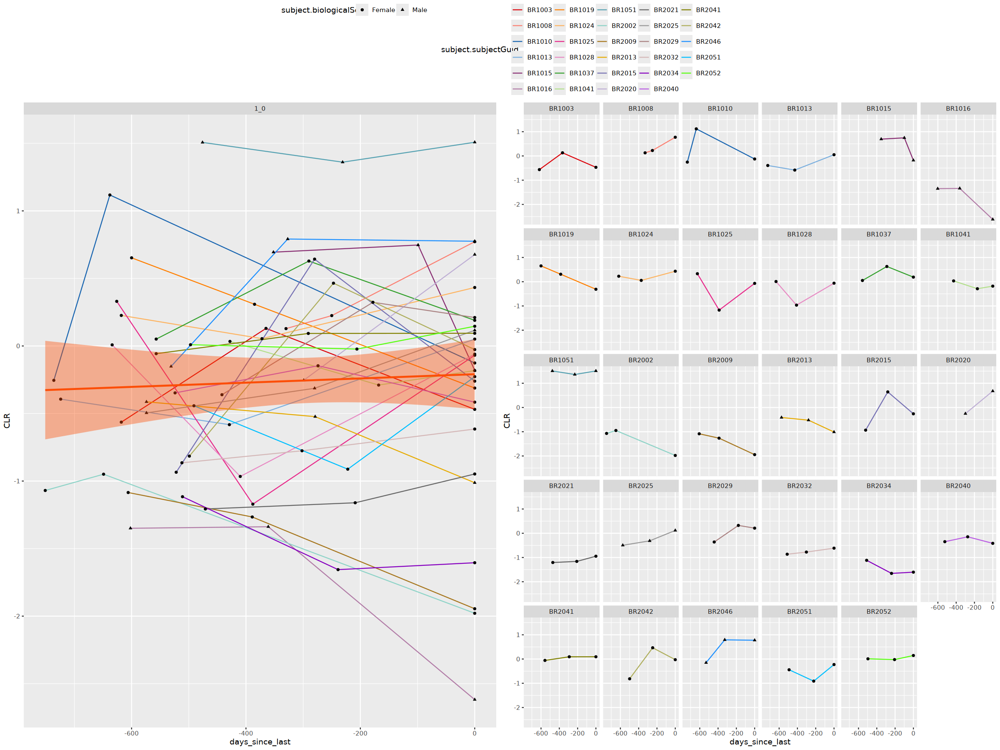

In [103]:
# take one cell type to model first
effector_freq_bri <- BRI_Bmem_freq_clr%>%filter(cell_type=='1_0')
p2 <- effector_freq_bri %>% ggplot(aes(x=days_since_last, y=`pseudo_clr`)) +
    geom_line(aes(color=subject.subjectGuid)) + geom_point(aes(shape=subject.biologicalSex))+ 
    stat_smooth(
  color = "#FC4E07", fill = "#FC4E07",
  method = "lm"
  ) + facet_wrap(vars(cell_type), scales = 'free_y') + scale_color_manual(values = cluster_colors)+ ylab('CLR')

p3 <- effector_freq_bri %>%  ggplot(aes(x=days_since_last, y=`pseudo_clr`)) +
    geom_line(aes(color=subject.subjectGuid)) + geom_point(aes(shape=subject.biologicalSex)) + 
    facet_wrap(vars(subject.subjectGuid)) + 
    scale_color_manual(values = cluster_colors)+ ylab('CLR')
ggpubr::ggarrange(p2, p3, common.legend = TRUE)
ggsave(file.path(fig_path, paste0(proj_name, 'BRI_switched_effectors_b_clr.png')), 
       width =12, height=6)

In [104]:
effector_freq_bri%>%distinct(subject.subjectGuid)

subject.subjectGuid
<chr>
BR1003
BR1008
BR2002
BR1010
BR1013
BR1024
BR1025
BR1015
BR2009


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


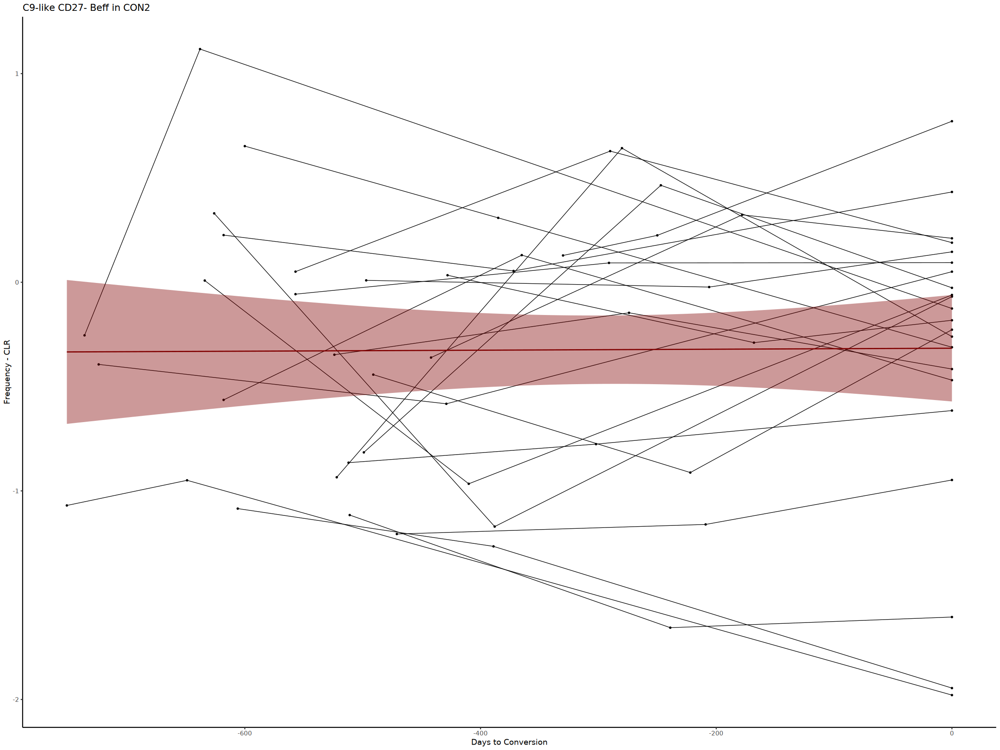

In [120]:
# plot the frequency
p1 <- effector_freq_bri %>%filter( subject.biologicalSex=='Female') %>%
    mutate(cohort='Control2') %>% mutate(sex=subject.biologicalSex) %>%
  ggplot(aes(x = days_since_last, y = pseudo_clr)) +
  geom_line(aes(group=subject.subjectGuid), size = 0.3) + 
  geom_point(size = 0.6 ) + 
  stat_smooth(
        method = "lm",
        color = "#800000",  # Color for the lm line
        fill = "#800000",  # Fill color for the confidence interval
        size = 0.6          # Thickness of the lm line
  ) + 
  labs(title = "C9-like CD27- Beff in CON2") + xlab('Days to Conversion') +  ylab('Frequency - CLR')+
  scale_color_manual(values = cluster_colors) + 
  theme(
    text = element_text(size = 10, face = "bold"),  # Set font size and style for all text
    axis.title = element_text(size = 10, face = "bold"),  # Set font size and style for axis titles
    axis.text = element_text(size = 10, face = "bold"),  # Set font size and style for axis labels
    plot.title = element_text(size = 10, face = "bold"),  # Set font size and style for plot title
    legend.position="top") +
  scale_shape_manual(values = c(1, 2))  + guides(color = FALSE) + theme_classic() 
 # Assigning different shapes to 'male' and 'female'
  #facet_wrap(~ clusters)  # Faceting by the 'clusters' column
p1
ggsave(file.path(fig_path, paste0(proj_name, 'BRI_C9-like_CLR.pdf')), 
       width =3, height=3)

In [106]:
effector_freq_bri%>%colnames()

[1] "sample.sampleKitGuid"                "cell_type"                          
 [3] "bmem_frequency"                      "subject.subjectGuid"                
 [5] "subject.biologicalSex"               "age"                                
 [7] "sample.drawDate"                     "sample.daysSinceFirstVisit"         
 [9] "sample.diseaseStatesRecordedAtVisit" "days_since_first"                   
[11] "total_b_counts"                      "file.batchID"                       
[13] "counts"                              "bmem_counts"                        
[15] "b_frequency"                         "BMI"                                
[17] "age_last"                            "bmi_last"                           
[19] "last_visit_day"                      "days_since_last"                    
[21] "pseudo_count"                        "pseudo_b_counts"                    
[23] "pseudo_b_frequency"                  "pseudo_clr"

In [110]:
effector_freq_bri%>%group_by(bmi_last)%>%tally()

bmi_last,n
<chr>,<int>
>25-30BMI,3
>30BMI,3
NA,80


In [111]:
# test in BRI only
formula=as.formula('pseudo_clr ~ age_last + days_since_last +  (1 | subject.subjectGuid)')
fit1 <- lmerTest::lmer(formula = formula, data = filter(effector_freq_bri, subject.biologicalSex=='Female'))
summary(fit1)

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: formula
   Data: filter(effector_freq_bri, subject.biologicalSex == "Female")

REML criterion at convergence: 131.5

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-2.10389 -0.52921  0.07981  0.51618  2.08668 

Random effects:
 Groups              Name        Variance Std.Dev.
 subject.subjectGuid (Intercept) 0.1830   0.4278  
 Residual                        0.1959   0.4426  
Number of obs: 66, groups:  subject.subjectGuid, 22

Fixed effects:
                  Estimate Std. Error         df t value Pr(>|t|)  
(Intercept)      6.610e-01  4.004e-01  2.181e+01   1.651   0.1131  
age_last        -2.036e-02  7.752e-03  1.998e+01  -2.626   0.0162 *
days_since_last -1.735e-05  2.286e-04  4.487e+01  -0.076   0.9398  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fixed Effects:
            (Intr) ag_lst
age_last    -0.949       
dys_snc_lst  0.21

## combine altra and BRI

In [143]:
# plot ALTRA and BRI switched B cells frequency
effector_freq_comb <- Bmem_freq_aim3%>%filter(cell_type=='8')%>%
    mutate(cohort='ALTRA', BMI=as.character(BMI), days_since_last=days_to_conversion)%>%
    bind_rows(BRI_Bmem_freq%>%filter(cell_type=='71')%>%mutate(cohort='BRI'))
effector_freq_comb

sample.sampleKitGuid,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,days_to_conversion,status,age,file.batchID,Status_Long,⋯,pseudo_clr,cohort,days_since_last,sample.drawDate,sample.daysSinceFirstVisit,sample.diseaseStatesRecordedAtVisit,days_since_first,age_last,bmi_last,last_visit_day
<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>,⋯,<dbl>,<chr>,<dbl>,<dttm>,<dbl>,<lgl>,<chr>,<dbl>,<chr>,<dbl>
KT00052,8,0.02398082,CU1009,Female,-714,at_risk,56,B140,pre,⋯,-0.492338843,ALTRA,-714,NA,NA,NA,NA,NA,NA,NA
KT00056,8,0.04970179,CU1007,Female,-632,at_risk,42,B002,pre,⋯,-0.021979678,ALTRA,-632,NA,NA,NA,NA,NA,NA,NA
KT00057,8,0.03433476,CU1003,Female,-615,at_risk,21,B002,pre,⋯,-0.343252835,ALTRA,-615,NA,NA,NA,NA,NA,NA,NA
KT00082,8,0.03977273,CU1007,Female,-540,at_risk,43,B005,pre,⋯,-0.020827340,ALTRA,-540,NA,NA,NA,NA,NA,NA,NA
KT00084,8,0.08771930,CU1029,Female,-614,at_risk,65,B010,pre,⋯,0.609719343,ALTRA,-614,NA,NA,NA,NA,NA,NA,NA
KT00099,8,0.04054054,CU1003,Female,-516,at_risk,22,B005,pre,⋯,-0.125220314,ALTRA,-516,NA,NA,NA,NA,NA,NA,NA
KT00103,8,0.06649616,SD1003,Female,-80,at_risk,36,B046,pre,⋯,0.303362914,ALTRA,-80,NA,NA,NA,NA,NA,NA,NA
KT00105,8,0.02141680,SD1007,Female,-92,at_risk,31,B070,pre,⋯,-0.684661882,ALTRA,-92,NA,NA,NA,NA,NA,NA,NA
KT00109,8,0.05882353,SD1003,Female,0,conversion,36,B046,conversion,⋯,-0.005519423,ALTRA,0,NA,NA,NA,NA,NA,NA,NA


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


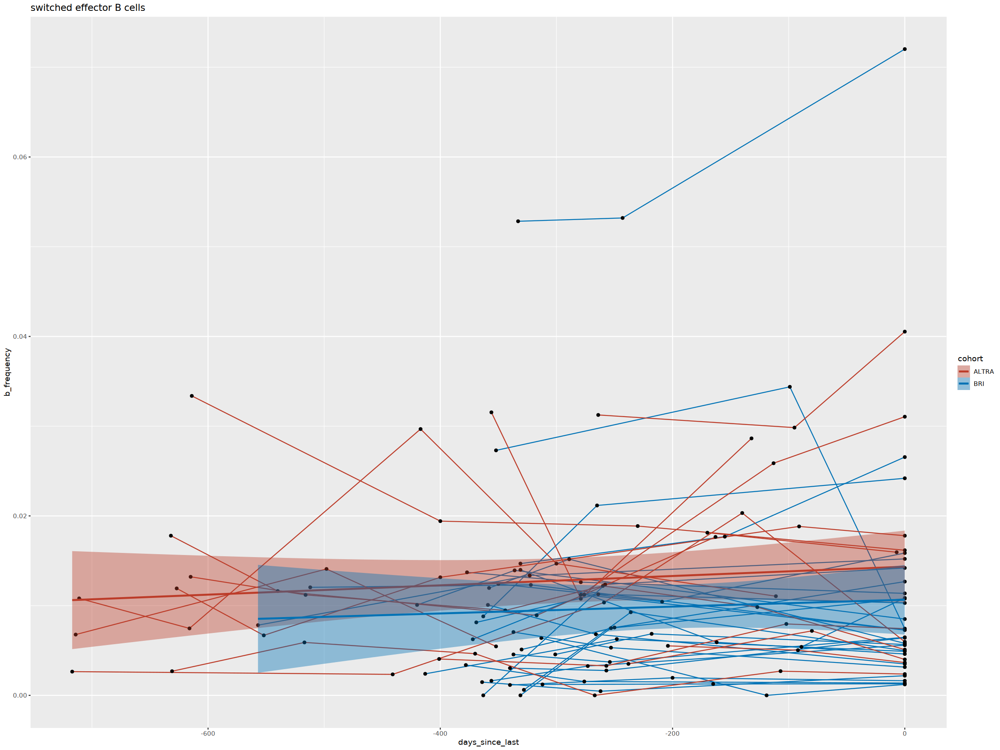

In [232]:
p1<- effector_freq_comb %>% ggplot(aes(x=days_since_last, y=b_frequency)) +
        geom_line(aes(group=subject.subjectGuid,color=cohort)) + geom_point()+ 
        stat_smooth( 
          aes(color = cohort, fill = cohort),
          method = "lm"
          ) + 
        scale_color_manual(values = nejm_color) + 
        scale_fill_manual(values = nejm_color) + ggtitle('switched effector B cells')
p1
ggsave(file.path(fig_path, paste0(proj_name, '_converters_BRI_switched_effectors_b_frequency.png')), 
       width =6, height=6)

In [173]:
# plot ALTRA and BRI switched B cells frequency
effector_clr_comb <- Bmem_freq_aim3%>%filter(cell_type=='8')%>%
    mutate(cohort='ALTRA', BMI=as.character(BMI), days_since_last=days_to_conversion, 
          age_last=age_conv, bmi_last=as.character(bmi_conv))%>%
    bind_rows(BRI_Bmem_freq_clr%>%filter(cell_type=='71')%>%mutate(cohort='BRI'))
effector_clr_comb%>%head()

sample.sampleKitGuid,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,days_to_conversion,status,age,file.batchID,Status_Long,⋯,pseudo_clr,cohort,days_since_last,age_last,bmi_last,sample.drawDate,sample.daysSinceFirstVisit,sample.diseaseStatesRecordedAtVisit,days_since_first,last_visit_day
<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>,⋯,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dttm>,<dbl>,<lgl>,<chr>,<dbl>
KT00052,8,0.02398082,CU1009,Female,-714,at_risk,56,B140,pre,⋯,-0.49233884,ALTRA,-714,58,25.6489176156766,NA,NA,NA,NA,NA
KT00056,8,0.04970179,CU1007,Female,-632,at_risk,42,B002,pre,⋯,-0.02197968,ALTRA,-632,44,26.1949770456387,NA,NA,NA,NA,NA
KT00057,8,0.03433476,CU1003,Female,-615,at_risk,21,B002,pre,⋯,-0.34325284,ALTRA,-615,23,23.1430618270797,NA,NA,NA,NA,NA
KT00082,8,0.03977273,CU1007,Female,-540,at_risk,43,B005,pre,⋯,-0.02082734,ALTRA,-540,44,26.1949770456387,NA,NA,NA,NA,NA
KT00084,8,0.08771930,CU1029,Female,-614,at_risk,65,B010,pre,⋯,0.60971934,ALTRA,-614,66,28.675466545289,NA,NA,NA,NA,NA
KT00099,8,0.04054054,CU1003,Female,-516,at_risk,22,B005,pre,⋯,-0.12522031,ALTRA,-516,23,23.1430618270797,NA,NA,NA,NA,NA


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


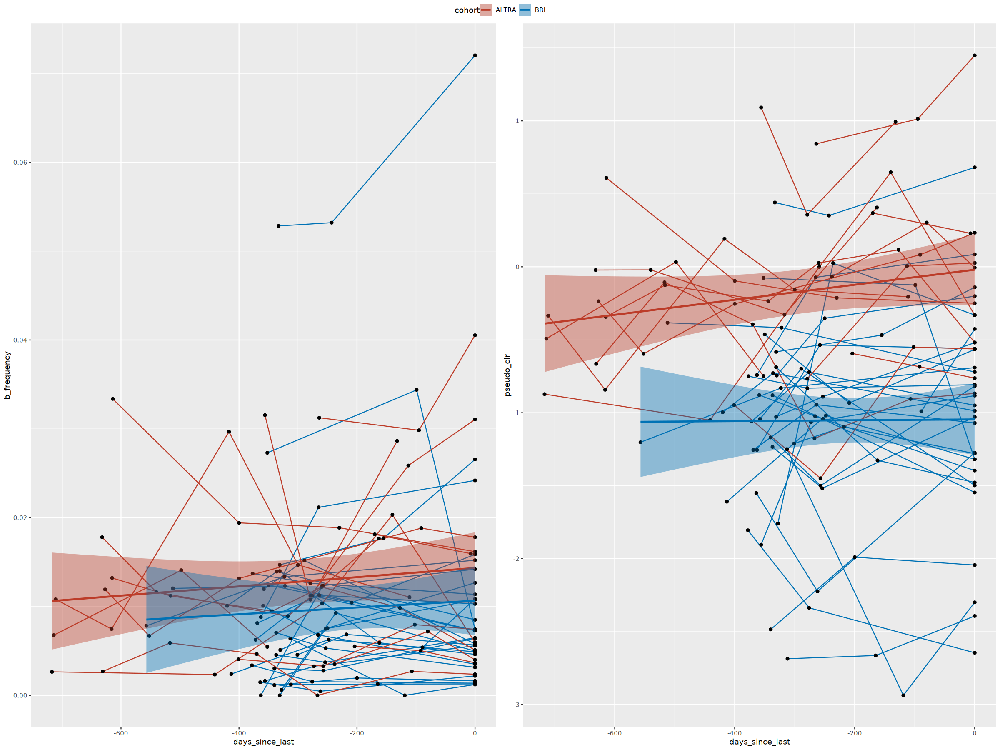

In [237]:
p1<- effector_clr_comb %>% ggplot(aes(x=days_since_last, y=b_frequency)) +
        geom_line(aes(group=subject.subjectGuid,color=cohort)) + geom_point()+ 
        stat_smooth( 
          aes(color = cohort, fill = cohort),
          method = "lm"
          ) + 
        scale_color_manual(values = nejm_color) + 
        scale_fill_manual(values = nejm_color) 
p2<- effector_clr_comb %>% ggplot(aes(x=days_since_last, y=pseudo_clr)) +
        geom_line(aes(group=subject.subjectGuid,color=cohort)) + geom_point()+ 
        stat_smooth( 
          aes(color = cohort, fill = cohort),
          method = "lm"
          ) + 
        scale_color_manual(values = nejm_color) + 
        scale_fill_manual(values = nejm_color)
ggpubr::ggarrange(p1, p2,  common.legend = TRUE)
ggsave(file.path(fig_path, paste0(proj_name, 'converters_BRI_switched_effectors_b.png')), 
       width =12, height=6)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


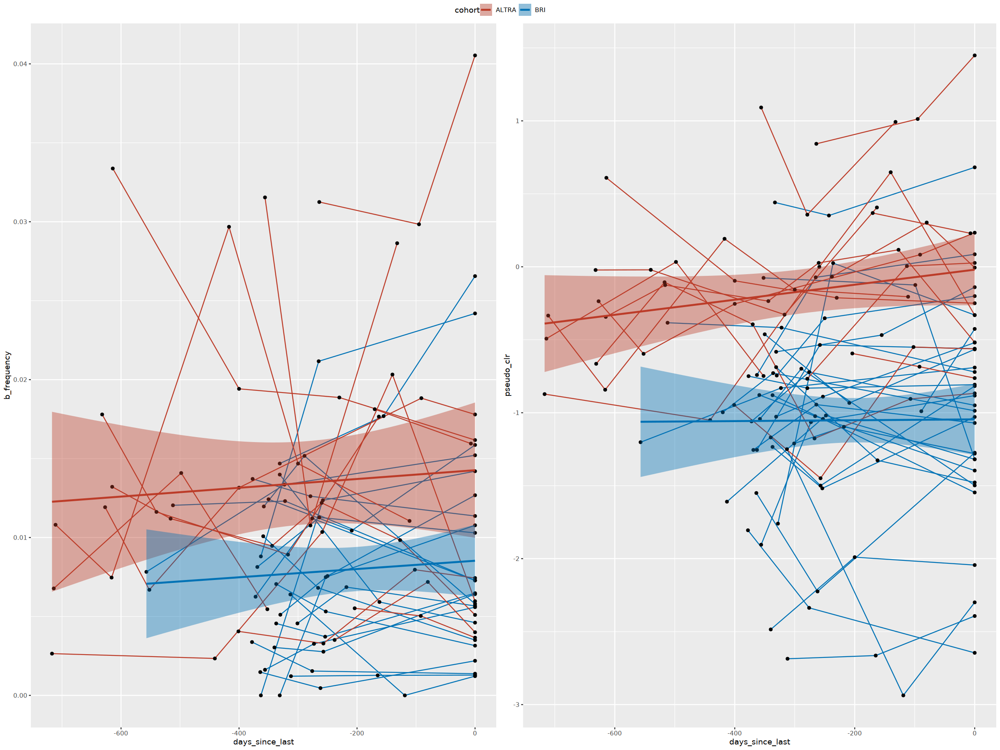

In [247]:
p1<- effector_clr_comb %>% filter(subject.biologicalSex=='Female')%>%ggplot(aes(x=days_since_last, y=b_frequency)) +
        geom_line(aes(group=subject.subjectGuid,color=cohort)) + geom_point()+ 
        stat_smooth( 
          aes(color = cohort, fill = cohort),
          method = "lm"
          ) + 
        scale_color_manual(values = nejm_color) + 
        scale_fill_manual(values = nejm_color) 
p2<- effector_clr_comb %>% ggplot(aes(x=days_since_last, y=pseudo_clr)) +
        geom_line(aes(group=subject.subjectGuid,color=cohort)) + geom_point()+ 
        stat_smooth( 
          aes(color = cohort, fill = cohort),
          method = "lm"
          ) + 
        scale_color_manual(values = nejm_color) + 
        scale_fill_manual(values = nejm_color)
ggpubr::ggarrange(p1, p2,  common.legend = TRUE)
ggsave(file.path(fig_path, paste0(proj_name, 'converters_BRI_switched_effectors_b_female.png')), 
       width =12, height=6)

In [35]:
effector_clr_comb%>%head()

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'head': object 'effector_clr_comb' not found


In [176]:
effector_clr_comb%>%filter(is.na(age_last))

Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”


sample.sampleKitGuid,cell_type,bmem_frequency,subject.subjectGuid,subject.biologicalSex,days_to_conversion,status,age,file.batchID,Status_Long,⋯,pseudo_clr,cohort,days_since_last,age_last,bmi_last,sample.drawDate,sample.daysSinceFirstVisit,sample.diseaseStatesRecordedAtVisit,days_since_first,last_visit_day
<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>,⋯,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dttm>,<dbl>,<lgl>,<chr>,<dbl>


In [243]:
# test in BRI only
formula=as.formula('pseudo_clr ~ age_last  + days_since_last +  (1 | subject.subjectGuid)')

fit1 <- lmerTest::lmer(formula = formula, data = filter(effector_clr_comb, cohort=='BRI' & subject.biologicalSex=='Female'))
summary(fit1)

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: formula
   Data: filter(effector_clr_comb, cohort == "BRI" & subject.biologicalSex ==  
    "Female")

REML criterion at convergence: 124.6

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-2.57688 -0.56466  0.08419  0.58389  2.11060 

Random effects:
 Groups              Name        Variance Std.Dev.
 subject.subjectGuid (Intercept) 0.2994   0.5471  
 Residual                        0.1315   0.3626  
Number of obs: 69, groups:  subject.subjectGuid, 23

Fixed effects:
                  Estimate Std. Error         df t value Pr(>|t|)
(Intercept)     -5.921e-01  4.541e-01  2.171e+01  -1.304    0.206
age_last        -1.050e-02  8.930e-03  2.098e+01  -1.176    0.253
days_since_last  6.152e-05  2.827e-04  4.551e+01   0.218    0.829

Correlation of Fixed Effects:
            (Intr) ag_lst
age_last    -0.955       
dys_snc_lst  0.131 -0.005

In [244]:
# test in BRI only
formula=as.formula('pseudo_clr ~ age_last  + days_since_last +  (1 | subject.subjectGuid)')

fit2 <- lmerTest::lmer(formula = formula, data = filter(effector_clr_comb, cohort=='ALTRA' & subject.biologicalSex=='Female'))
summary(fit2)

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: formula
   Data: 
filter(effector_clr_comb, cohort == "ALTRA" & subject.biologicalSex ==  
    "Female")

REML criterion at convergence: 88.9

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-1.81760 -0.50823  0.06393  0.51062  2.33730 

Random effects:
 Groups              Name        Variance Std.Dev.
 subject.subjectGuid (Intercept) 0.2448   0.4947  
 Residual                        0.1345   0.3667  
Number of obs: 50, groups:  subject.subjectGuid, 13

Fixed effects:
                  Estimate Std. Error         df t value Pr(>|t|)  
(Intercept)     -0.3547021  0.5538292 10.6828778  -0.640   0.5354  
age_last         0.0097592  0.0112314 10.4846829   0.869   0.4043  
days_since_last  0.0005801  0.0002694 40.0396865   2.153   0.0374 *
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fixed Effects:
            (Intr) ag_lst
age_last    -0.95

In [245]:
formula=as.formula('pseudo_clr ~ age_last + days_since_last + cohort + (days_since_last:cohort) + 
    (1 | subject.subjectGuid)')

fit <- lmerTest::lmer(formula = formula, data = filter(effector_clr_comb,  subject.biologicalSex=='Female'))

In [246]:
summary(fit)

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: formula
   Data: filter(effector_clr_comb, subject.biologicalSex == "Female")

REML criterion at convergence: 209

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-2.53606 -0.59318  0.04818  0.56918  2.32202 

Random effects:
 Groups              Name        Variance Std.Dev.
 subject.subjectGuid (Intercept) 0.2885   0.5371  
 Residual                        0.1329   0.3646  
Number of obs: 119, groups:  subject.subjectGuid, 36

Fixed effects:
                            Estimate Std. Error         df t value Pr(>|t|)    
(Intercept)                0.2676768  0.3774959 34.2787847   0.709   0.4831    
age_last                  -0.0034558  0.0071074 32.4074239  -0.486   0.6301    
days_since_last            0.0005734  0.0002689 89.1981029   2.132   0.0357 *  
cohortBRI                 -1.2020991  0.2196773 46.6329424  -5.472 1.71e-06 ***
days_since_last:cohortBRI -0.0005144  0.